# CONTEXTE 

Vous êtes Data Scientist au sein de l’entreprise "Place de marché”, qui souhaite lancer une marketplace e-commerce.

Sur cette place de marché anglophone, des vendeurs proposent des articles à des acheteurs en postant une photo et une description.

Pour l'instant, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs, et est donc peu fiable. De plus, le volume des articles est pour l’instant très petit.

Pour rendre l’expérience utilisateur des vendeurs (faciliter la mise en ligne de nouveaux articles) et des acheteurs (faciliter la recherche de produits) la plus fluide possible, et dans l'optique d'un passage à l'échelle, il devient nécessaire d'automatiser cette tâche d‘attribution de la catégorie.

Linda, Lead Data Scientist, vous demande donc d'étudier la faisabilité d'un moteur de classification des articles en différentes catégories, à partir du texte (en anglais) et de l’image comme dans l’illustration ci-dessous.

Une image et un texte décrivant un produit mènent à une flèche vers un label, pour illustrer l'assignation automatique.


![alt text](image.png)

## PREMIÈRE PARTIE / PREMIER LIVRABLE & DEUXIÈME LIVRABLE (TEXTES & IMAGES)
Voici le mail qu’elle vous a envoyé. 

De : Linda

À : moi

Objet: démarrage de la mission

Bonjour, 

Merci pour ton aide sur ce projet !

Ta mission sera de réaliser une étude de **faisabilité d'un moteur de classification automatique d’articles**, en utilisant **leur image et leur description** sur le jeu de données d'articles disponible dans la première pièce jointe de ce mail.

Pourrais-tu analyser les ***descriptions textuelles et les images des produits***, au travers des étapes suivantes : 

- Un **prétraitement des données texte et image**
- Une **extraction de features** 
- Une **réduction en 2 dimensions**, afin de projeter les produits sur un graphique 2D, sous la forme de points dont la couleur correspondra à la catégorie réelle 
- Une **analyse du graphique afin de conclure**, à l’aide des descriptions ou des images, sur la faisabilité de regrouper automatiquement des produits de même catégorie 
- Une **réalisation d’une mesure pour confirmer ton analyse visuelle**, en calculant la similarité entre les catégories réelles et les catégories issues d’une segmentation en clusters
 

Pourrais-tu nous démontrer ainsi la faisabilité de regrouper automatiquement des produits de même catégorie ?

Afin d’extraire ***les features image***, il sera nécessaire de mettre en œuvre :

- un **algorithme de type SIFT / ORB / SURF** ;
- un a**lgorithme de type CNN Transfer Learning**.
 

Afin ***d’extraire les features texte***, il sera nécessaire de mettre en œuvre : 

- **deux approches de type bag-of-words**, comptage simple de mots et **Tf-idf** ;
- une approche de type **word/sentence embedding classique avec Word2Vec** (ou Glove ou FastText) ;
- une approche de type **word/sentence embedding avec BERT** ;
- une approche de type **word/sentence embedding avec USE** (Universal Sentence Encoder).
 

Pour t’aider, en deuxième pièce jointe, tu trouveras un exemple de Notebook mettant en œuvre les approches d’extraction de features d’images sur un autre dataset.

Merci encore, 

Linda

PS : J’ai bien vérifié qu’il n’y avait aucune contrainte de propriété intellectuelle sur les données et les images.

Pièces jointes : 

- PJ 1 : [Jeu de données d’articles](https://s3-eu-west-1.amazonaws.com/static.oc-static.com/prod/courses/files/Parcours_data_scientist/Projet+-+Textimage+DAS+V2/Dataset+projet+pre%CC%81traitement+textes+images.zip)
- PJ 2 : [Notebook d’extraction de features d’images et d’étude de faisabilité](https://s3.eu-west-1.amazonaws.com/course.oc-static.com/projects/Data_Scientist_P6/Weather_Images_CNN_Transfer_Learning_Stage_1_feasibility_V1.0.ipynb)

## DEUXIÈME PARTIE / TROISIÈME LIVRABLE

Vous partagez votre travail avec Linda. Elle vous invite désormais à aller plus loin dans l’analyse d’images. 

Voici le mail qu’elle vous a envoyé.

De  : Linda

À : Moi

Objet : suite de la mission

Bonjour, 

Merci beaucoup pour ton travail ! Voici la suite de ta mission : 

Pourrais-tu **réaliser une classification supervisée à partir des images** ? Je souhaiterais que tu **mettes en place une data augmentation afin d’optimiser le modèle**.


## TROISÈME PARTIE / QUATRIÈME LIVRABLE

De plus, nous souhaitons élargir notre gamme de produits à l’épicerie fine. 

Pour cela, pourrais-tu **tester la collecte de produits à base de “champagne” via l’API** disponible [ici ](https://developer.edamam.com/food-database-api)? 

## TROISÈME PARTIE / CINQUIÈME LIVRABLE

Pourrais-tu ensuite nous proposer **un script ou notebook Python permettant une extraction des 10 premiers produits dans un fichier “.csv”**, contenant pour chaque produit les données suivantes : foodId, label, category, foodContentsLabel, image.

## QUATRIÈME PARTIE / SIXIÈME LIVRABLE

Enfin, pourrais-tu formaliser dans un **support de présentation de 30 slides maximum** au format PDF l’ensemble de ta démarche ainsi que les résultats d’analyse les plus pertinents  ?

Merci encore, bon courage !

Linda
PS : En pièce jointe, tu trouveras pour t’aider un exemple de mise en œuvre de classification supervisée sur un autre dataset.

PJ : [Notebook d’exemple de classification supervisée d’images](https://s3.eu-west-1.amazonaws.com/course.oc-static.com/projects/Data_Scientist_P6/Weather_Images_CNN_Transfer_Learning_Stage_2_supervised_classification_V1.0.ipynb)



## Livrables
  

- Un ou des notebooks (ou des fichiers .py) contenant les fonctions permettant le prétraitement et la feature extraction des données textes et images ainsi que les résultats de l’étude de faisabilité (graphiques, mesure de similarité) 
- Un notebook de classification supervisée des images
- Un script Python (notebook ou fichier .py) de test de l’API et le fichier au format “csv” contenant les produits extraits
- Un support de présentation pour la soutenance, détaillant le travail réalisé (Powerpoint ou équivalent, sauvegardé en pdf, 30 slides maximum) : 
    - l’étude de faisabilité
    - la classification supervisée
    - test de l’API

# CLASSIFICATION DE BIENS DE CONSOMMATION AUTOMATISÉE PAR L'IMAGE ET LE TEXTE



# 2EME PARTIE : classification supervisée des produits par catégories principales à partir des images des produits

# IMPORTS LIBRAIRIES

In [1]:
# data & science
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
# représentations graphiques
import matplotlib.pyplot as plt
from matplotlib.image import imread
import seaborn as sns
%matplotlib inline
# system & tools
import time
import os
import random
# computer vision / CNN
import tensorflow as tf
print("tensorflow", tf.__version__)
# TensorFlow utilise un seul thread pour garantir la reproductibilité
tf.config.threading.set_intra_op_parallelism_threads(1)
tf.config.threading.set_inter_op_parallelism_threads(1)
import keras
print("keras", keras.__version__)
from keras.applications import DenseNet121   


2025-01-05 09:23:03.183195: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:10575] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-05 09:23:03.183245: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:479] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-05 09:23:03.184565: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1442] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-05 09:23:03.190188: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX, in other operations, rebuild TensorFlow with the appropriate compiler flags.


tensorflow 2.16.2
keras 3.6.0


## Reproductibilité des résultats

In [2]:
# Seed value
seed_value= 1802

# 1. Set the `PYTHONHASHSEED` environment variable at a fixed value
os.environ['PYTHONHASHSEED']=str(seed_value)
print("os.environ['PYTHONHASHSEED'] == ", os.environ['PYTHONHASHSEED'])

# 2. Set the `python` built-in pseudo-random generator at a fixed value
random.seed(seed_value)

# 3. Set the `numpy` pseudo-random generator at a fixed value
np.random.seed(seed_value)

# 4. Set the `tensorflow` pseudo-random generator at a fixed value
tf.random.set_seed(seed_value)
tf.keras.utils.set_random_seed(seed_value) 

# 5. Configuration spécifique liée à l'utilisation des GPUs
## rapport de bug : "GPU MaxPool gradient ops do not yet have a deterministic XLA implementation" https://github.com/tensorflow/tensorflow/issues/69417
## I have the same problem about MaxPooling2D. The following tutorial about reproducibility of keras confirmed that the same error occurs: https://keras.io/examples/keras_recipes/reproducibility_recipes/
## I wrote this guide when Keras had jit_compile = None (Keras 2 or tf-keras) in the compile method. Now, Keras 3 uses jit_compile = "auto" (trying to use XLA) for the TensorFlow backend, which is the root of the error.
## You can simply pass jit_compile = False if you're using Keras 3.
tf.config.experimental.enable_op_determinism() # se trouve dans la partie API expérimental (call temporaire) depuis juin 2024, remplace os.environ['TF_DETERMINISTIC_OPS']  
# => dans modele.compile mettre jit_compile=False "just in time compiler"

# 6. Vérifier la reproductibilité
random_values_1 = tf.random.uniform([5], seed=seed_value)
print("TF/KERAS Valeurs aléatoires 1:", random_values_1.numpy())
tf.random.set_seed(seed_value)
tf.keras.utils.set_random_seed(seed_value) 
random_values_2 = tf.random.uniform([5], seed=seed_value)
print("TF/KERAS Valeurs aléatoires 2:", random_values_2.numpy())
assert np.array_equal(random_values_1.numpy(), random_values_2.numpy()), "TF/KERAS Les valeurs aléatoires ne sont pas identiques"
print("TF/KERAS Les valeurs aléatoires sont identiques, la graine est correctement fixée.")

os.environ['PYTHONHASHSEED'] ==  1802
TF/KERAS Valeurs aléatoires 1: [0.43668258 0.59952414 0.27555966 0.6870636  0.05337238]
TF/KERAS Valeurs aléatoires 2: [0.43668258 0.59952414 0.27555966 0.6870636  0.05337238]
TF/KERAS Les valeurs aléatoires sont identiques, la graine est correctement fixée.


2025-01-05 09:23:05.178534: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-01-05 09:23:05.179091: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-01-05 09:23:05.179587: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

In [3]:
# Vérifier le nombre de GPU disponibles
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  4


# Import et préparation des données

In [4]:
# récupérer le dataset avec les images préparées (forme carrée)
data_reshaped = pd.read_csv("./reshaped_image_dataset.csv")
data_reshaped.info()
display(data_reshaped.tail(1))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   uniq_id              1050 non-null   object
 1   product_name         1050 non-null   object
 2   image                1050 non-null   object
 3   categ_0              1050 non-null   object
 4   label                1050 non-null   int64 
 5   image_path           1050 non-null   object
 6   height               1050 non-null   int64 
 7   width                1050 non-null   int64 
 8   is_square            1050 non-null   bool  
 9   reshaped_image_path  1050 non-null   object
 10  reshaped_height      1050 non-null   int64 
 11  reshaped_width       1050 non-null   int64 
dtypes: bool(1), int64(5), object(6)
memory usage: 91.4+ KB


,uniq_id,product_name,image,categ_0,label,image_path,height,width,is_square,reshaped_image_path,reshaped_height,reshaped_width
1049,f2f027ad6a6df617c9f125173da71e44,Uberlyfe Large Vinyl Sticker,f2f027ad6a6df617c9f125173da71e44.jpg,baby care,0,./Flipkart/Images/f2f027ad6a6df617c9f125173da7...,1100,1100,True,./reshaped_images/f2f027ad6a6df617c9f125173da7...,1100,1100


In [5]:
# vérification de la répartition des images par label
display(data_reshaped.groupby("label").count())

,uniq_id,product_name,image,categ_0,image_path,height,width,is_square,reshaped_image_path,reshaped_height,reshaped_width
label,,,,,,,,,,,
0,150,150,150,150,150,150,150,150,150,150,150
1,150,150,150,150,150,150,150,150,150,150,150
2,150,150,150,150,150,150,150,150,150,150,150
3,150,150,150,150,150,150,150,150,150,150,150
4,150,150,150,150,150,150,150,150,150,150,150
5,150,150,150,150,150,150,150,150,150,150,150
6,150,150,150,150,150,150,150,150,150,150,150


In [6]:
# récupérer le dictionnaire des labels et des noms des catégories pour la lisibilité des évaluations
label_to_category = dict(zip(data_reshaped['label'], data_reshaped['categ_0']))
label_to_category

{4: 'home furnishing',
 0: 'baby care',
 6: 'watches',
 3: 'home decor & festive needs',
 5: 'kitchen & dining',
 1: 'beauty and personal care',
 2: 'computers'}

In [7]:
# récupérer les chemins des images et leurs labels
image_paths = data_reshaped['reshaped_image_path'].values
labels = data_reshaped['label'].values 

In [8]:
# adapter les dimensions des images pour le modèle DenseNet121
img_height = 224
img_width = 224

In [9]:
# shuffle des index des images pour mélanger les données avant la séparation en ensemble de train et de test
indices = np.arange(len(image_paths))
np.random.shuffle(indices)
image_paths = image_paths[indices]
labels = labels[indices]

## TRAIN-TEST Split

## Fonctions

In [10]:
# Fonction pour charger et prétraiter les images pour les adapter au modèle DenseNet121
def load_and_preprocess_image(path, label):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [img_height, img_width])
    image = image / 255.0  # Normaliser les pixels entre 0 et 1
    return image, label

# Créer des datasets adaptés à TensorFlow pour chaque ensemble
def create_dataset(paths, labels, batch_size=32):
    dataset = tf.data.Dataset.from_tensor_slices((paths, labels))
    dataset = dataset.map(load_and_preprocess_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size=len(paths), seed=seed_value)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

In [11]:
# répartition en 70% / 15% / 15%
train_paths, temp_paths, train_labels, temp_labels = train_test_split(
    image_paths, labels, test_size=0.30, stratify=labels, random_state=seed_value)

val_paths, test_paths, val_labels, test_labels = train_test_split(
    temp_paths, temp_labels, test_size=0.50, stratify=temp_labels, random_state=seed_value)


In [12]:
# création des datasets
train_dataset = create_dataset(train_paths, train_labels)
val_dataset = create_dataset(val_paths, val_labels)
test_dataset = create_dataset(test_paths, test_labels)
print("nbre de batch dans train_dataset", len(train_dataset))
print("nbre de batch dans val_dataset", len(val_dataset))
print("nbre de batch dans test_dataset", len(test_dataset))


nbre de batch dans train_dataset 23
nbre de batch dans val_dataset 5
nbre de batch dans test_dataset 5


2025-01-05 09:23:12.940037: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-01-05 09:23:13.592840: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-01-05 09:23:14.409697: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


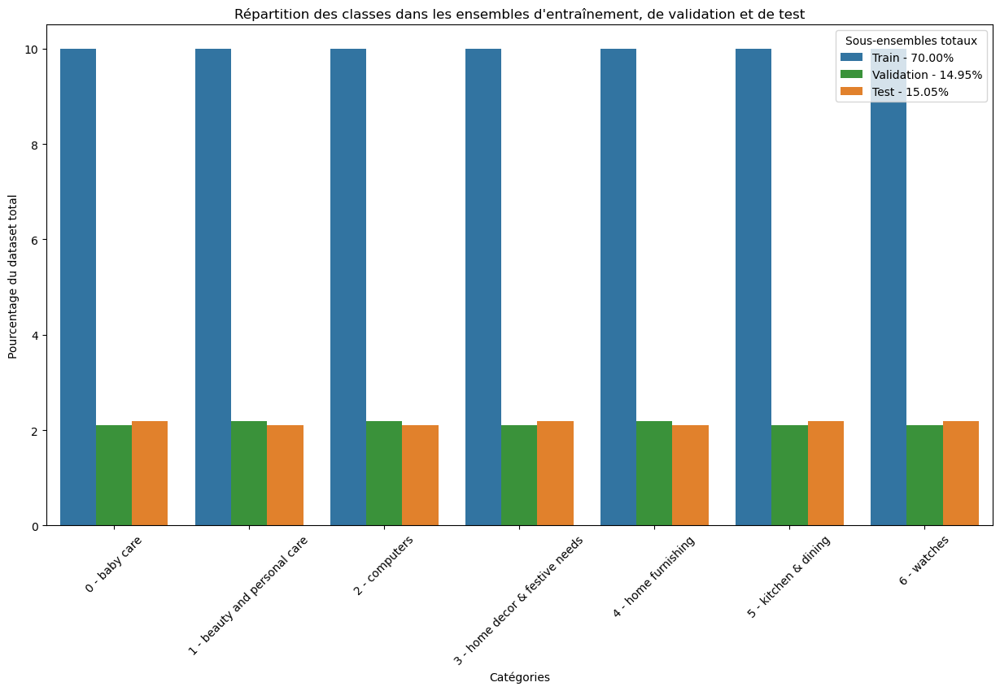

In [13]:
# s'assurer de la répartition équilibrée des classes dans les ensembles d'entraînement, de validation et de test

def extract_labels(dataset):
    labels = []
    for _, label in dataset.unbatch():
        labels.append(label.numpy())
    return np.array(labels)

# labels des datasets
train_labels = extract_labels(train_dataset)
val_labels = extract_labels(val_dataset)
test_labels = extract_labels(test_dataset)

# répartition des classes
train_counts = np.unique(train_labels, return_counts=True)
val_counts = np.unique(val_labels, return_counts=True)
test_counts = np.unique(test_labels, return_counts=True)
total_counts = np.sum([train_counts[1], val_counts[1], test_counts[1]])

train_total_percentage = (np.sum(train_counts[1]) / total_counts) * 100
val_total_percentage = (np.sum(val_counts[1]) / total_counts) * 100
test_total_percentage = (np.sum(test_counts[1]) / total_counts) * 100

train_percentages = (train_counts[1] / total_counts) * 100
val_percentages = (val_counts[1] / total_counts) * 100
test_percentages = (test_counts[1] / total_counts) * 100

# correspondance avec les noms des catégories
categories = np.concatenate([train_counts[0], val_counts[0], test_counts[0]])
category_names = [f'{label} - {label_to_category[label]}' for label in categories]

data = {
    'Catégories': category_names,
    'Pourcentage': np.concatenate([train_percentages, val_percentages, test_percentages]),
    'Ensemble': ['Train'] * len(train_counts[0]) + ['Validation'] * len(val_counts[0]) + ['Test'] * len(test_counts[0])
}
df = pd.DataFrame(data)

palette = {'Train': '#1f77b4', 'Validation': '#2ca02c', 'Test': '#ff7f0e'}
plt.figure(figsize=(15, 8))
sns.barplot(x='Catégories', y='Pourcentage', hue='Ensemble', data=df, palette=palette)
plt.title('Répartition des classes dans les ensembles d\'entraînement, de validation et de test')
plt.xlabel('Catégories')
plt.ylabel('Pourcentage du dataset total')
plt.xticks(rotation=45)
handles, labels = plt.gca().get_legend_handles_labels()
labels = [
    f'Train - {train_total_percentage:.2f}%',
    f'Validation - {val_total_percentage:.2f}%',
    f'Test - {test_total_percentage:.2f}%'
]
plt.legend(handles=handles, labels=labels, title='Sous-ensembles totaux')
plt.show()

# Classification des images - Tests des différents scénarios

* LES 4 SCÉNARIOS : 
    - Modèle 1A : Entraînement avec les poids imagenet - SANS Data Augmentation
    - Modèle 2B : Entraînement avec les poids imagenet - AVEC Data Augmentation 
    - Modèle 2A : Entraînement SANS les poids imagenet - SANS Data Augmentation
    - Modèle 2B : Entraînement SANS les poids imagenet - AVEC Data Augmentation 


## Fonctions

In [14]:
# graphique matrice de confusion
def plot_confusion_matrix(conf_matrix, dataset_name, data_augment=False):
    if dataset_name == 'VALIDATION':
        color = 'Greens'
    elif dataset_name == 'TRAIN':
        color = 'Blues'
    elif dataset_name == 'TRAIN+VALIDATION':
        color = 'PuBuGn' 
    elif dataset_name == 'TEST':
        color = 'YlOrBr' # Oranges YlOrBr
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap=color, xticklabels=label_to_category.values(), yticklabels=label_to_category.values())
    plt.xlabel('Prédits', fontsize=14)
    plt.ylabel('Réels', fontsize=14)
    if data_augment:
        plt.title(f'Confusion Matrix - {dataset_name} - avec data augmentation', fontsize=16)
    else:
        plt.title(f'Confusion Matrix - {dataset_name} - sans data augmentation', fontsize=16)
    plt.show()
    
# visualisation des images bien et mal classées sur le TEST
def visualisation_images_TEST(etat, y_test, y_test_pred_classes, X_test, dict_label=label_to_category, num_examples=6):
    categories = np.unique(y_test)

    # Récupérer les index des images bien et mal classées
    if etat == 'BIEN':
        indices = np.where(y_test_pred_classes == y_test)[0]
        title = "TEST - Images BIEN classées"
    elif etat == 'MAL':
        indices = np.where(y_test_pred_classes != y_test)[0]
        title = "TEST - Images MAL classées"
    else:
        raise ValueError("L'état doit être 'BIEN' ou 'MAL'")

    # Init dict des exemples
    examples = {category: [] for category in categories}
    # Récupérer les exemples par catégories
    for category in categories:
        category_indices = indices[y_test[indices] == category]
        if len(category_indices) >= num_examples:
            examples[category] = category_indices[:num_examples]
        else:
            examples[category] = category_indices

    # Affichage des exemples par catégories
    fig, axes = plt.subplots(len(categories), num_examples, figsize=(num_examples * 3, len(categories) * 3), facecolor='black')
    fig.suptitle(title, color='white', fontsize=16)

    plt.subplots_adjust(hspace=0.5)

    for i, category in enumerate(categories):
        axes[i, 0].annotate(f'Catégorie réelle : {label_to_category[category]}', xy=(0, 1), xytext=(0, 1.2),
                            xycoords='axes fraction', textcoords='axes fraction',
                            ha='left', va='bottom', color='white', fontsize=14, annotation_clip=False)

        for j in range(num_examples):
            if j < len(examples[category]):
                idx = examples[category][j]
                rescaled_image = X_test[idx]  # Les images sont déjà normalisées
                axes[i, j].imshow(rescaled_image)
                pred_label = label_to_category[y_test_pred_classes[idx]]
                axes[i, j].set_title(f"Pred: {pred_label}", color='white', fontsize=10)
            axes[i, j].axis('off')

    plt.show()
    
# Fonction pour obtenir les prédictions du modèle sur un dataset
def get_predictions(model, dataset):
    y_true = []
    y_pred = []
    X_true = []

    for images, labels in dataset:
        y_true.extend(labels.numpy())
        preds = model.predict(images)
        y_pred.extend(np.argmax(preds, axis=1))
        X_true.extend(images.numpy())

    return np.array(X_true), np.array(y_true), np.array(y_pred)


## Vérifier la reproductibilité

In [15]:
tf.random.set_seed(seed_value)
tf.keras.utils.set_random_seed(seed_value) 
random_values_1 = tf.random.uniform([5], seed=seed_value)
print("TF/KERAS Valeurs aléatoires 1:", random_values_1.numpy())
tf.random.set_seed(seed_value)
tf.keras.utils.set_random_seed(seed_value) 
random_values_2 = tf.random.uniform([5], seed=seed_value)
print("TF/KERAS Valeurs aléatoires 2:", random_values_2.numpy())
assert np.array_equal(random_values_1.numpy(), random_values_2.numpy()), "TF/KERAS Les valeurs aléatoires ne sont pas identiques"
print("TF/KERAS Les valeurs aléatoires sont identiques, la graine est correctement fixée.")

TF/KERAS Valeurs aléatoires 1: [0.43668258 0.59952414 0.27555966 0.6870636  0.05337238]
TF/KERAS Valeurs aléatoires 2: [0.43668258 0.59952414 0.27555966 0.6870636  0.05337238]
TF/KERAS Les valeurs aléatoires sont identiques, la graine est correctement fixée.


## Liste des GPU

In [16]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:3', device_type='GPU')]

## Liste des résultats des scénarii

In [17]:
# enregistrer les résultats sur le test pour comparaison des scénarii
perf_test_df = pd.DataFrame(columns=['Scenario', 'Description', 'Accuracy_TrainVal', 'Loss_TrainVal', 'Accuracy_Test', 'Loss_Test', 'Durée_training'])

# 1. Entraînement DenseNet121 AVEC les poids imagenet

## 1.A Entraînement avec les poids imagenet - SANS Data_augmentation

### Modèle

In [18]:
# couche d'entrée
input_tensor = tf.keras.layers.Input(shape=(img_height, img_width, 3))
# Desnet121 pré-entraîné sur ImageNet sans la couche de sortie initiale
base_model = DenseNet121(weights='imagenet', include_top=False, input_tensor=input_tensor)
# Geler les poids des couches du modèle de base (=transfert learning = préserve les connaissances issues des poids du modèle pré-entraîné)
for layer in base_model.layers:
    layer.trainable = False
    
# couches de sorties personnalisées
x = base_model.output
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
output_tensor = tf.keras.layers.Dense(7, activation='softmax')(x)  # 7 classes

model = tf.keras.models.Model(inputs=input_tensor, outputs=output_tensor)

# paramètres d'entraînement
nb_epochs=25
es_patience=8
lr_patience=3
# visualisation du modèle
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 58,425,927 (222.88 MB)

 Trainable params: 51,388,423 (196.03 MB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [19]:
# compiler le modèle 
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)
metrics=['accuracy']
model.compile(optimizer=optimizer, loss=loss, metrics=metrics, jit_compile=False) 
# "just in time compiler" sur false pour option deterministe et garantir la reproductibilité cf: tf.config.experimental.enable_op_determinism()

In [20]:
# définition des callbacks : ajustements du processus d'entraînement sous certaines conditions
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=es_patience, restore_best_weights=True)
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=lr_patience, min_lr=1e-4)


In [21]:
# entraînement
time1 = time.time()
history = model.fit(train_dataset, epochs=nb_epochs, validation_data=val_dataset, 
                    callbacks=[early_stopping, lr_scheduler])
time2 = time.time() - time1
minutes, seconds = divmod(time2, 60)
duration_str = f"{int(minutes)} min {int(seconds)} sec"

Epoch 1/25


2025-01-05 09:23:35.032621: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907


23/23 ━━━━━━━━━━━━━━━━━━━━ 27s 453ms/step - accuracy: 0.3819 - loss: 30.3458 - val_accuracy: 0.8025 - val_loss: 5.9829 - learning_rate: 0.0010
Epoch 2/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - accuracy: 0.8123 - loss: 3.8582 - val_accuracy: 0.8089 - val_loss: 4.8351 - learning_rate: 0.0010
Epoch 3/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - accuracy: 0.8685 - loss: 1.6265 - val_accuracy: 0.8471 - val_loss: 3.6647 - learning_rate: 0.0010
Epoch 4/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 207ms/step - accuracy: 0.9212 - loss: 0.6575 - val_accuracy: 0.8153 - val_loss: 3.6242 - learning_rate: 0.0010
Epoch 5/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 208ms/step - accuracy: 0.9329 - loss: 0.5009 - val_accuracy: 0.8408 - val_loss: 3.0076 - learning_rate: 0.0010
Epoch 6/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.9440 - loss: 0.4078 - val_accuracy: 0.8408 - val_loss: 2.4041 - learning_rate: 0.0010
Epoch 7/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 9s 250ms/step - accuracy: 0.9643 - loss: 0.1779 - val_accur

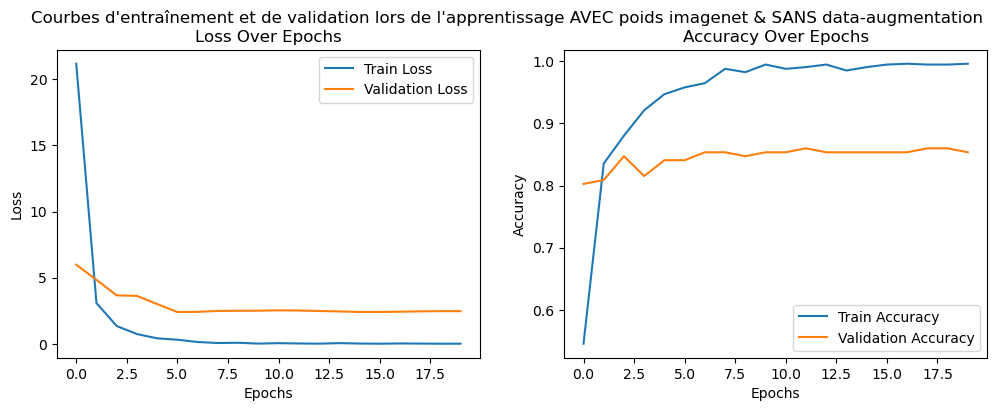

In [22]:
plt.figure(figsize=(12, 4))

# visualiser la perte pendant l'apprentissage
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()

# visualiser l'accuracy pendant l'apprentissage
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs')
plt.legend()

plt.suptitle("Courbes d'entraînement et de validation lors de l'apprentissage AVEC poids imagenet & SANS data-augmentation")
plt.show()

### Évaluation TRAIN

In [23]:
X_train, y_train, y_train_pred_classes = get_predictions(model, train_dataset)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


2025-01-05 09:26:39.155131: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [24]:
print("Classification Report  - TRAIN - AVEC poids imagenet & SANS data-augmentation :")
print(classification_report(y_train, y_train_pred_classes))

Classification Report  - TRAIN - AVEC poids imagenet & SANS data-augmentation :
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       105
           1       1.00      1.00      1.00       105
           2       1.00      1.00      1.00       105
           3       1.00      1.00      1.00       105
           4       1.00      1.00      1.00       105
           5       1.00      1.00      1.00       105
           6       1.00      1.00      1.00       105

    accuracy                           1.00       735
   macro avg       1.00      1.00      1.00       735
weighted avg       1.00      1.00      1.00       735



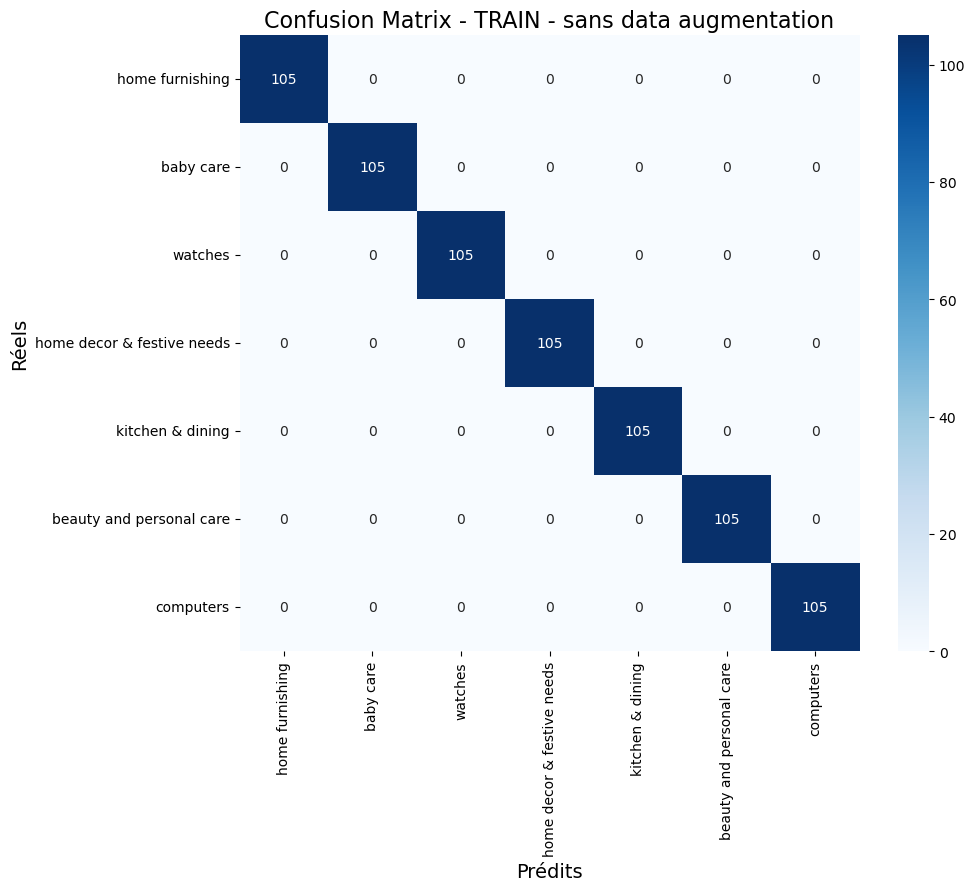

In [25]:
conf_matrix_train = confusion_matrix(y_train, y_train_pred_classes)
plot_confusion_matrix(conf_matrix_train, 'TRAIN',  data_augment=False)

### Évaluation VALIDATION

In [26]:
X_val, y_val, y_val_pred_classes = get_predictions(model, val_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


2025-01-05 09:26:41.869264: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [27]:
print("Classification Report  - VALIDATION - AVEC poids imagenet & SANS data-augmentation :")
print(classification_report(y_val, y_val_pred_classes))

Classification Report  - VALIDATION - AVEC poids imagenet & SANS data-augmentation :
              precision    recall  f1-score   support

           0       0.83      0.68      0.75        22
           1       0.77      0.87      0.82        23
           2       0.87      0.87      0.87        23
           3       0.76      0.86      0.81        22
           4       0.95      0.83      0.88        23
           5       0.91      0.91      0.91        22
           6       0.96      1.00      0.98        22

    accuracy                           0.86       157
   macro avg       0.86      0.86      0.86       157
weighted avg       0.86      0.86      0.86       157



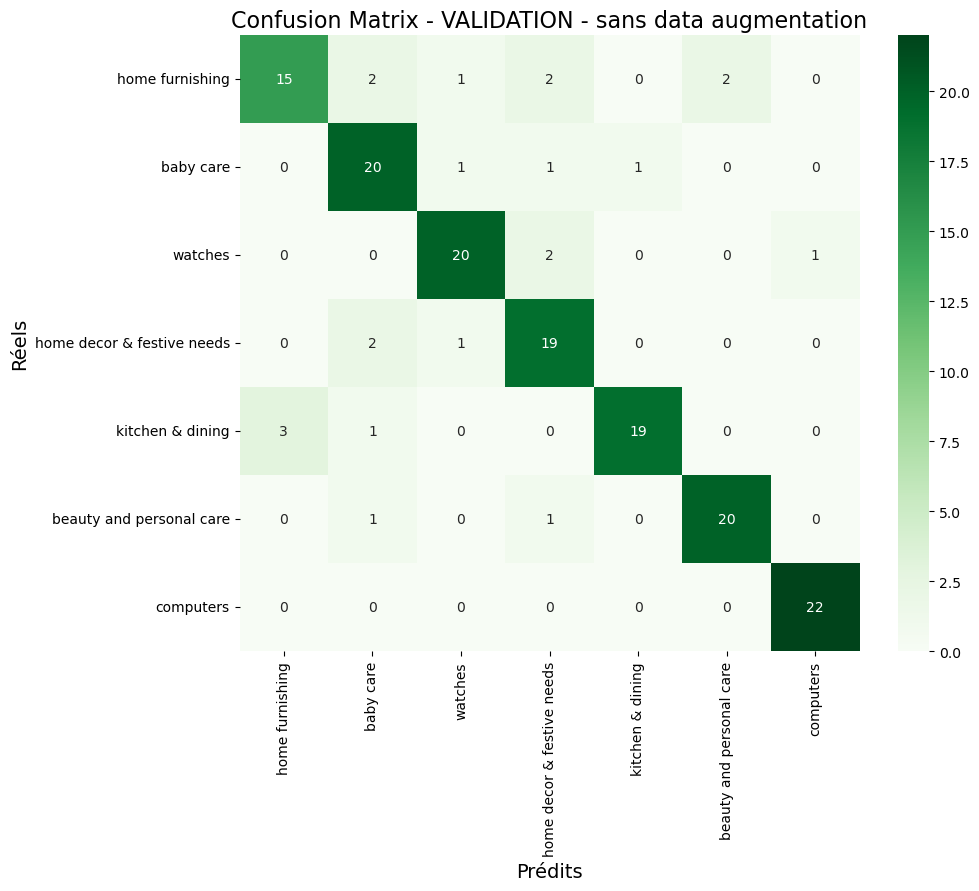

In [28]:
conf_matrix_val = confusion_matrix(y_val, y_val_pred_classes)
plot_confusion_matrix(conf_matrix_val, 'VALIDATION',  data_augment=False)

### Évaluation TRAIN+VALIDATION

In [29]:
train_val_dataset = train_dataset.concatenate(val_dataset)
loss_trainval, accuracy_trainval = model.evaluate(train_val_dataset)

28/28 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - accuracy: 0.9965 - loss: 0.0652


In [30]:
X_train_val, y_train_val, y_train_val_pred_classes = get_predictions(model, train_val_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

2025-01-05 09:27:00.005613: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [31]:
print("Classification Report  - TRAIN+VALIDATION - AVEC poids imagenet & SANS data-augmentatio :")
print(classification_report(y_train_val, y_train_val_pred_classes))

Classification Report  - TRAIN+VALIDATION - AVEC poids imagenet & SANS data-augmentatio :
              precision    recall  f1-score   support

           0       0.98      0.94      0.96       127
           1       0.95      0.98      0.97       128
           2       0.98      0.98      0.98       128
           3       0.95      0.98      0.96       127
           4       0.99      0.97      0.98       128
           5       0.98      0.98      0.98       127
           6       0.99      1.00      1.00       127

    accuracy                           0.98       892
   macro avg       0.98      0.98      0.98       892
weighted avg       0.98      0.98      0.98       892



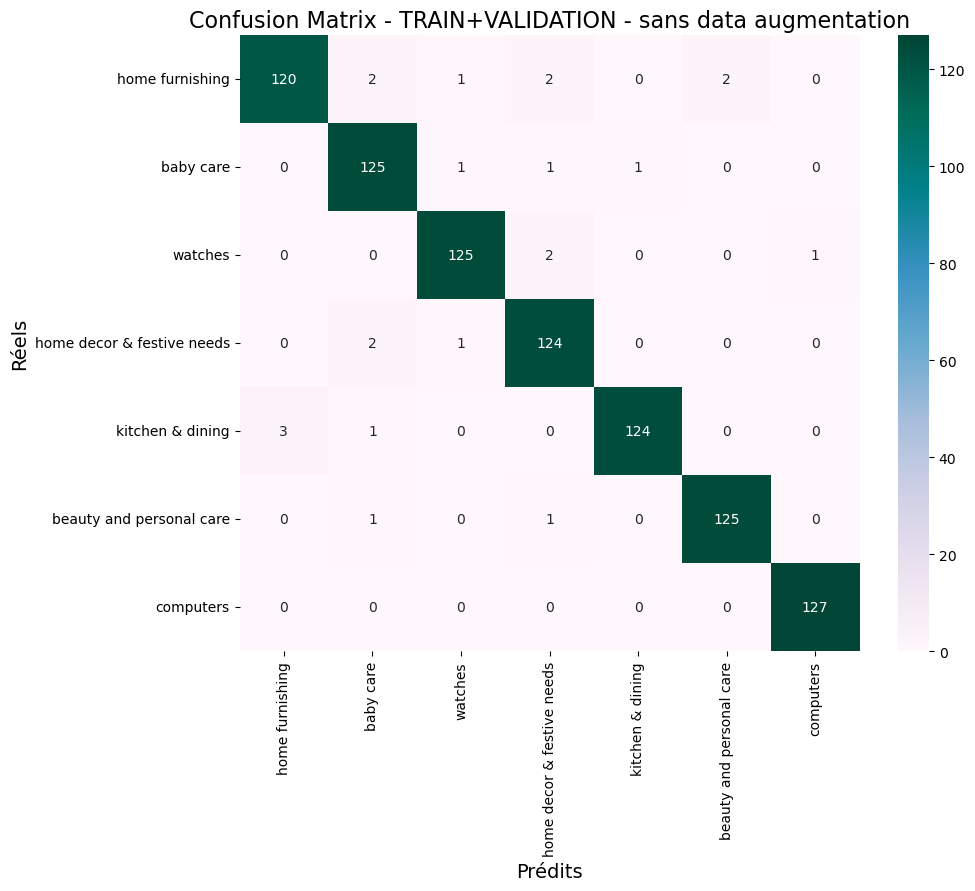

In [32]:
conf_matrix_train_val = confusion_matrix(y_train_val, y_train_val_pred_classes)
plot_confusion_matrix(conf_matrix_train_val, 'TRAIN+VALIDATION',  data_augment=False)

### Évaluation TEST

In [33]:
loss_test, accuracy_test = model.evaluate(test_dataset)

5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.8987 - loss: 1.0929


In [34]:
X_test, y_test ,y_test_pred_classes = get_predictions(model, test_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


2025-01-05 09:27:04.649288: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [35]:
print("Classification Report - TEST - AVEC poids imagenet & SANS data-augmentation :")
print(classification_report(y_test, y_test_pred_classes))

Classification Report - TEST - AVEC poids imagenet & SANS data-augmentation :
              precision    recall  f1-score   support

           0       0.89      0.74      0.81        23
           1       0.83      0.86      0.84        22
           2       0.88      0.95      0.91        22
           3       0.84      0.91      0.88        23
           4       0.82      0.82      0.82        22
           5       0.95      0.91      0.93        23
           6       1.00      1.00      1.00        23

    accuracy                           0.89       158
   macro avg       0.89      0.89      0.88       158
weighted avg       0.89      0.89      0.89       158



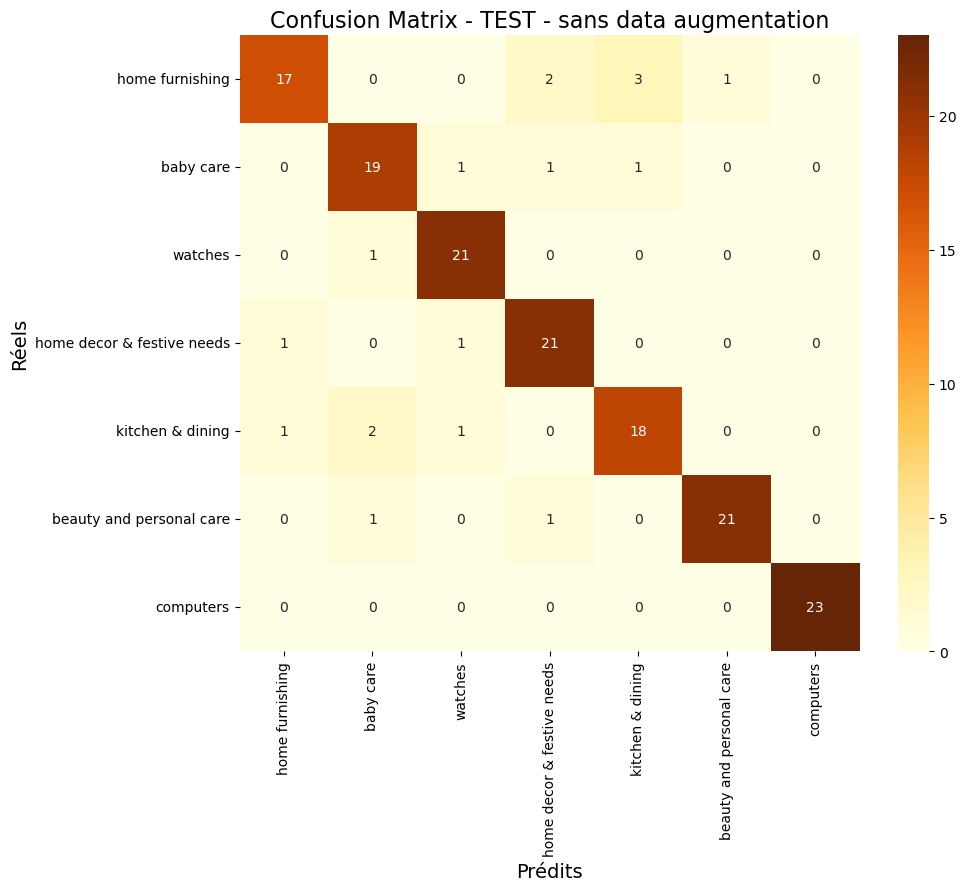

In [36]:
conf_matrix_test = confusion_matrix(y_test, y_test_pred_classes)
plot_confusion_matrix(conf_matrix_test, 'TEST',  data_augment=False)

### Enregistrement des résultats

In [37]:
perf_test_df = pd.concat([perf_test_df, pd.DataFrame({'Scenario': ['model_1A'], 
                                                      'Description': ['AVEC poids imagenet & SANS data-augmentation'], 
                                                      'Accuracy_TrainVal': [accuracy_trainval *100],
                                                      'Loss_TrainVal' : [loss_trainval],
                                                      'Accuracy_Test': [accuracy_test *100], 
                                                      'Loss_Test': [loss_test],
                                                      'Durée_training': [duration_str]})], ignore_index=True)
perf_test_df

/tmp/ipykernel_839367/1571747771.py:1: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  perf_test_df = pd.concat([perf_test_df, pd.DataFrame({'Scenario': ['model_1A'],


,Scenario,Description,Accuracy_TrainVal,Loss_TrainVal,Accuracy_Test,Loss_Test,Durée_training
0,model_1A,AVEC poids imagenet & SANS data-augmentation,97.533631,0.443065,88.607597,1.236787,3 min 4 sec


### Visualisation des images bien et mal classées sur le TEST

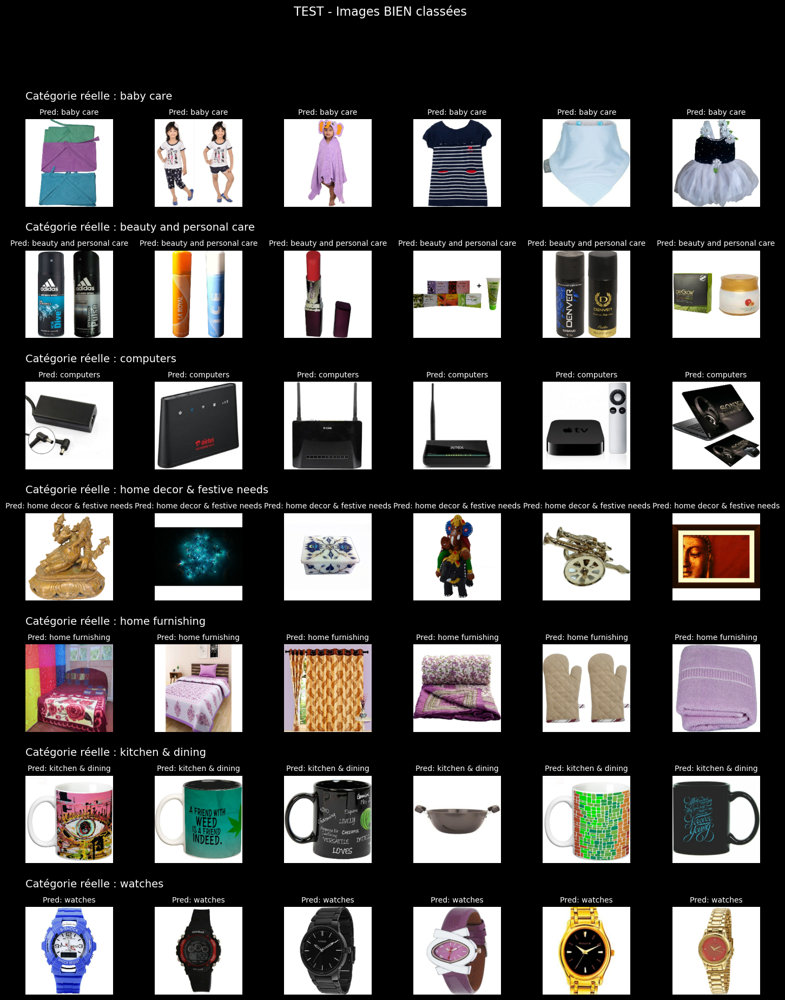

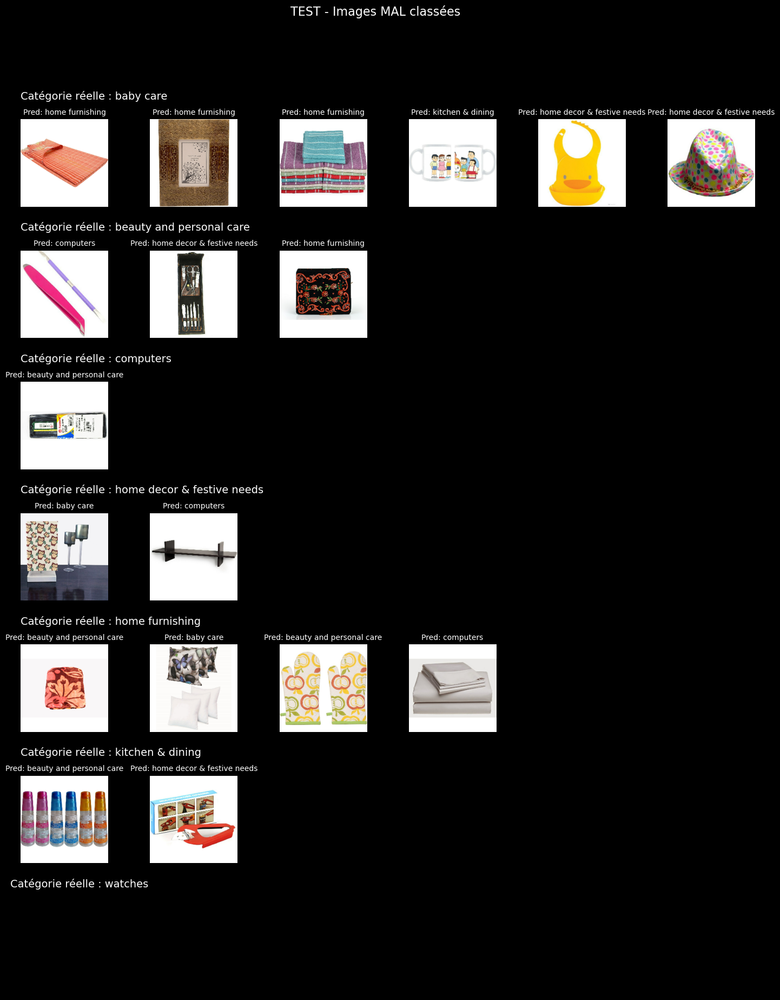

In [38]:
visualisation_images_TEST('BIEN', y_test, y_test_pred_classes, X_test, dict_label=label_to_category, num_examples=6)
visualisation_images_TEST('MAL', y_test, y_test_pred_classes, X_test, dict_label=label_to_category, num_examples=6)

- certaines sont mal classées car elles ressemblent à des articles d'autres classes, par exemple un ensemble de literie pour bébé classé dans home furnishing au lieu de baby care. même un opérateur humain aurait pu faire cette erreur.
- d'autres résultats sont plus sybillins : un nécessaire de manucure classé en home decor, ou des draps blancs classés dans computers

## 1.B Entraînement avec les poids imagenet - AVEC Data_augmentation

* pour rappel, les transformations retenues :
    - rotation gauche ou droite de 2 degrés
    - zoom 1.2x


### Modèle

In [39]:
# préparation de la data augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomRotation(0.0349),  # Rotation gauche ou droite de 0.0349 radians, équivalent à 2 degrés (= Pi * X degrés / 180 degrés)
    tf.keras.layers.RandomZoom((0.0, 0.2)),  # Zoom aléatoire entre 1x et 1.2x
])
# couche d'entrée
input_tensor = tf.keras.layers.Input(shape=(img_height, img_width, 3))
augmented_input = data_augmentation(input_tensor)
# Desnet121 pré-entraîné sur ImageNet sans la couche de sortie initiale
base_model = DenseNet121(weights='imagenet', include_top=False, input_tensor=augmented_input)
# Geler les poids des couches du modèle de base (=transfert learning = préserve les connaissance issues des poids du modèle pré-entraîné)
for layer in base_model.layers:
    layer.trainable = False
    
# couches de sorties personnalisées
x = base_model.output
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
output_tensor = tf.keras.layers.Dense(7, activation='softmax')(x)  # 7 classes

model = tf.keras.models.Model(inputs=input_tensor, outputs=output_tensor)

# paramètres d'entraînement
nb_epochs=25
es_patience=8
lr_patience=3
# visualisation du modèle
model.summary()


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 230, 230,  │          0 │ sequential[0][0]  │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_3… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b

 Total params: 58,425,927 (222.88 MB)

 Trainable params: 51,388,423 (196.03 MB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [40]:
# compiler le modèle 
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)
metrics=['accuracy']
model.compile(optimizer=optimizer, loss=loss, metrics=metrics, jit_compile=False) 
# "just in time compiler" sur false pour option deterministe et garantir la reproductibilité cf: tf.config.experimental.enable_op_determinism()

In [41]:
# définition des callbacks : ajustements du processus d'entraînement sous certaines conditions
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=es_patience, restore_best_weights=True)
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=lr_patience, min_lr=1e-4)

In [42]:
# entraînement
time1 = time.time()
history = model.fit(train_dataset, epochs=nb_epochs, validation_data=val_dataset, 
                    callbacks=[early_stopping, lr_scheduler])
time2 = time.time() - time1
minutes, seconds = divmod(time2, 60)
duration_str = f"{int(minutes)} min {int(seconds)} sec"

Epoch 1/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 24s 420ms/step - accuracy: 0.3745 - loss: 26.7317 - val_accuracy: 0.7962 - val_loss: 8.4995 - learning_rate: 0.0010
Epoch 2/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - accuracy: 0.7893 - loss: 6.4969 - val_accuracy: 0.8408 - val_loss: 4.3464 - learning_rate: 0.0010
Epoch 3/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 214ms/step - accuracy: 0.8537 - loss: 1.9450 - val_accuracy: 0.7962 - val_loss: 4.9072 - learning_rate: 0.0010
Epoch 4/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - accuracy: 0.8572 - loss: 1.5107 - val_accuracy: 0.8471 - val_loss: 2.6235 - learning_rate: 0.0010
Epoch 5/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 212ms/step - accuracy: 0.9271 - loss: 0.6258 - val_accuracy: 0.8217 - val_loss: 1.9563 - learning_rate: 0.0010
Epoch 6/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 209ms/step - accuracy: 0.9494 - loss: 0.3155 - val_accuracy: 0.8408 - val_loss: 2.0645 - learning_rate: 0.0010
Epoch 7/25
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 213ms/step - accuracy: 0.9594 - loss: 0.2069 

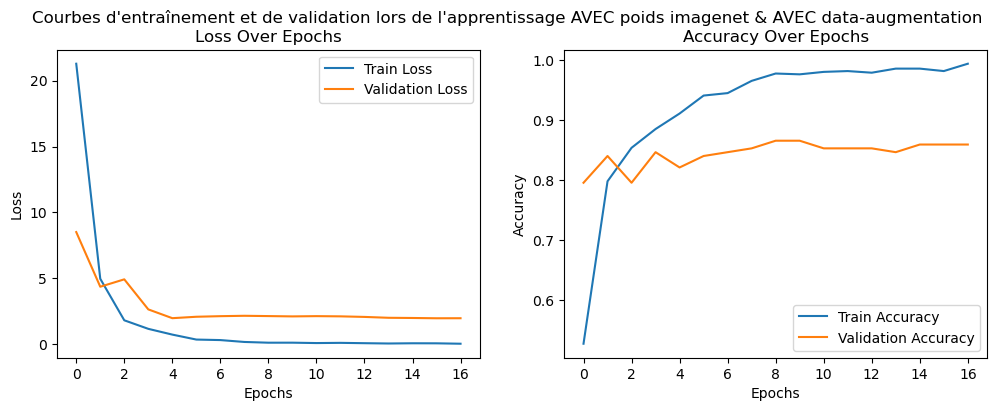

In [43]:
plt.figure(figsize=(12, 4))

# visualiser la perte pendant l'apprentissage
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()

# visualiser l'accuracy pendant l'apprentissage
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs')
plt.legend()

plt.suptitle("Courbes d'entraînement et de validation lors de l'apprentissage AVEC poids imagenet & AVEC data-augmentation")
plt.show()

### Évaluation TRAIN

In [44]:
X_train, y_train, y_train_pred_classes = get_predictions(model, train_dataset)


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


2025-01-05 09:30:07.091887: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [45]:
print("Classification Report  - TRAIN - AVEC poids imagenet & AVEC data-augmentation :")
print(classification_report(y_train, y_train_pred_classes))

Classification Report  - TRAIN - AVEC poids imagenet & AVEC data-augmentation :
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       105
           1       1.00      0.98      0.99       105
           2       1.00      1.00      1.00       105
           3       0.99      1.00      1.00       105
           4       0.98      0.99      0.99       105
           5       1.00      1.00      1.00       105
           6       1.00      1.00      1.00       105

    accuracy                           0.99       735
   macro avg       0.99      0.99      0.99       735
weighted avg       0.99      0.99      0.99       735



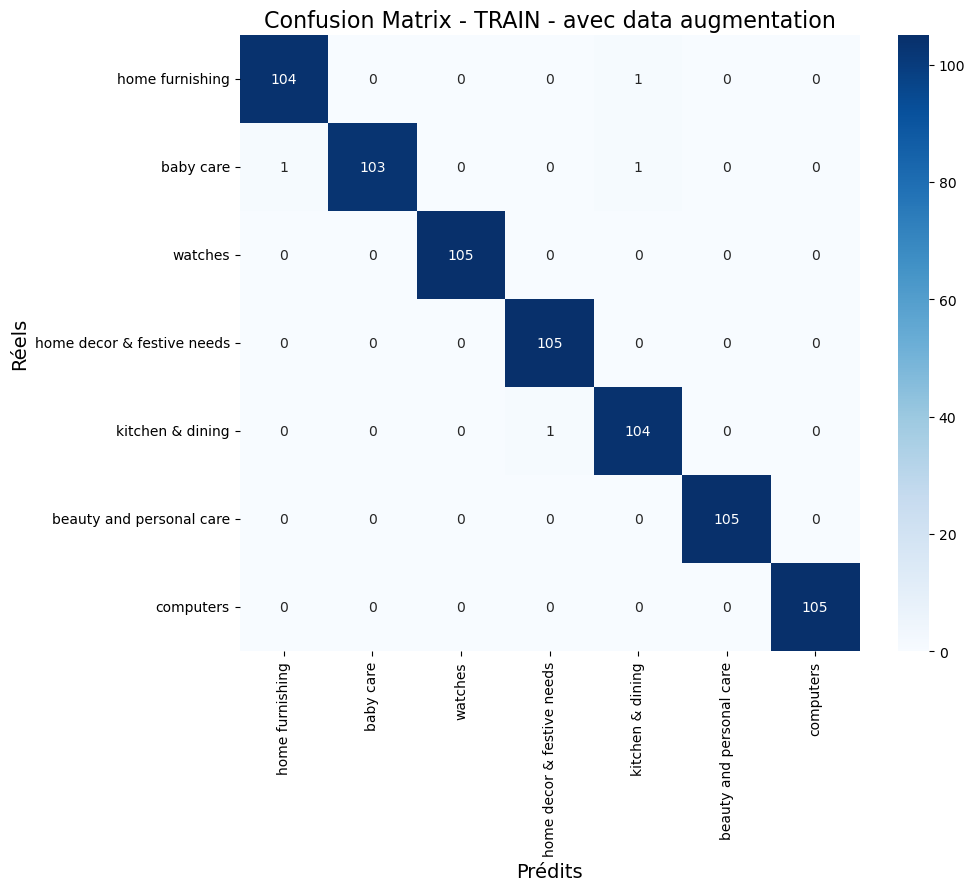

In [46]:
conf_matrix_train = confusion_matrix(y_train, y_train_pred_classes)
plot_confusion_matrix(conf_matrix_train, 'TRAIN',  data_augment=True)

### Évaluation VALIDATION

In [47]:
X_val, y_val, y_val_pred_classes = get_predictions(model, val_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


2025-01-05 09:30:09.787959: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [48]:
print("Classification Report  - VALIDATION - AVEC poids imagenet & AVEC data-augmentation :")
print(classification_report(y_val, y_val_pred_classes))

Classification Report  - VALIDATION - AVEC poids imagenet & AVEC data-augmentation :
              precision    recall  f1-score   support

           0       0.79      0.68      0.73        22
           1       0.83      0.87      0.85        23
           2       0.87      0.87      0.87        23
           3       0.78      0.82      0.80        22
           4       0.91      0.87      0.89        23
           5       0.88      0.95      0.91        22
           6       1.00      1.00      1.00        22

    accuracy                           0.87       157
   macro avg       0.87      0.87      0.86       157
weighted avg       0.87      0.87      0.86       157



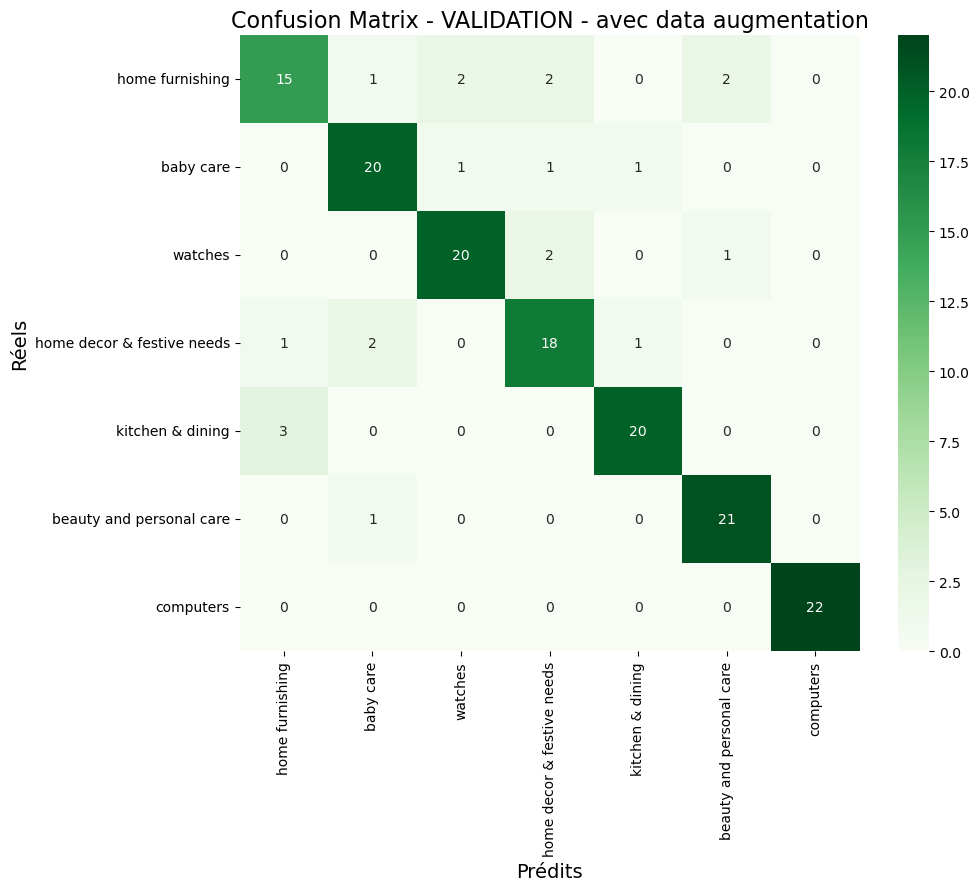

In [49]:
conf_matrix_val = confusion_matrix(y_val, y_val_pred_classes)
plot_confusion_matrix(conf_matrix_val, 'VALIDATION',  data_augment=True)

### Évaluation TRAIN+VALIDATION

In [50]:
train_val_dataset = train_dataset.concatenate(val_dataset)
loss_trainval, accuracy_trainval = model.evaluate(train_val_dataset)

28/28 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - accuracy: 0.9906 - loss: 0.0683


In [51]:
X_train_val, y_train_val, y_train_val_pred_classes = get_predictions(model, train_val_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

2025-01-05 09:30:27.883394: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [52]:
print("Classification Report  - TRAIN+VALIDATION - AVEC poids imagenet & AVEC data-augmentation :")
print(classification_report(y_train_val, y_train_val_pred_classes))

Classification Report  - TRAIN+VALIDATION - AVEC poids imagenet & AVEC data-augmentation :
              precision    recall  f1-score   support

           0       0.96      0.94      0.95       127
           1       0.97      0.96      0.96       128
           2       0.98      0.98      0.98       128
           3       0.95      0.97      0.96       127
           4       0.97      0.97      0.97       128
           5       0.98      0.99      0.98       127
           6       1.00      1.00      1.00       127

    accuracy                           0.97       892
   macro avg       0.97      0.97      0.97       892
weighted avg       0.97      0.97      0.97       892



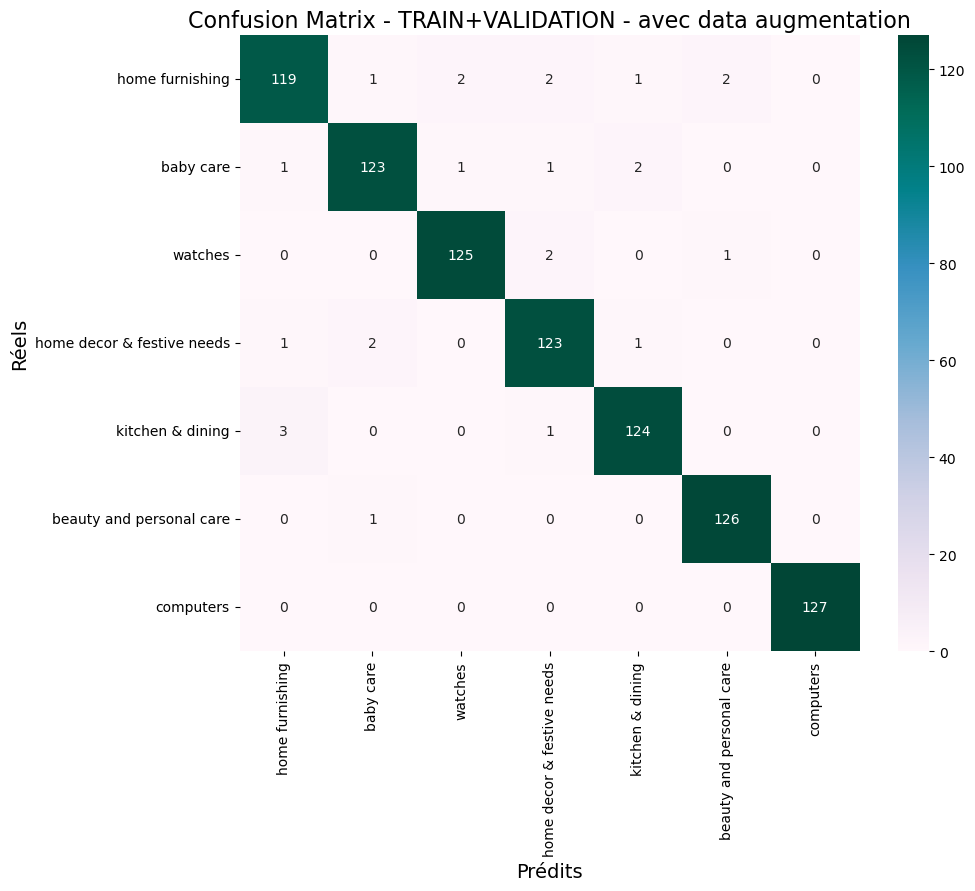

In [53]:
conf_matrix_train_val = confusion_matrix(y_train_val, y_train_val_pred_classes)
plot_confusion_matrix(conf_matrix_train_val, 'TRAIN+VALIDATION',  data_augment=True)

### Évaluation TEST

In [54]:
loss_test, accuracy_test = model.evaluate(test_dataset)

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.8656 - loss: 1.3112


In [55]:
X_test, y_test ,y_test_pred_classes = get_predictions(model, test_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


2025-01-05 09:30:32.408423: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [56]:
print("Classification Report - TEST - AVEC poids imagenet & SANS data-augmentation :")
print(classification_report(y_test, y_test_pred_classes))

Classification Report - TEST - AVEC poids imagenet & SANS data-augmentation :
              precision    recall  f1-score   support

           0       0.83      0.65      0.73        23
           1       0.89      0.77      0.83        22
           2       0.88      0.95      0.91        22
           3       0.72      0.78      0.75        23
           4       0.78      0.82      0.80        22
           5       0.85      0.96      0.90        23
           6       1.00      1.00      1.00        23

    accuracy                           0.85       158
   macro avg       0.85      0.85      0.85       158
weighted avg       0.85      0.85      0.85       158



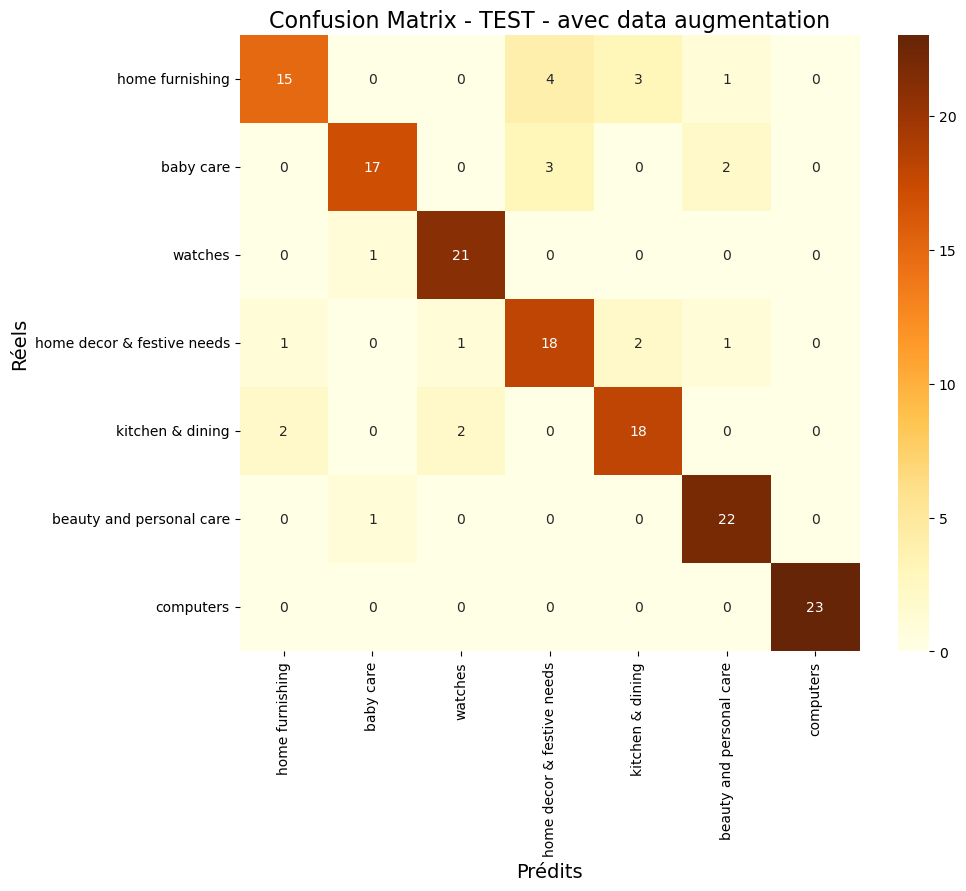

In [57]:
conf_matrix_test = confusion_matrix(y_test, y_test_pred_classes)
plot_confusion_matrix(conf_matrix_test, 'TEST',  data_augment=True)

### Enregistrement des résultats

In [58]:
perf_test_df = pd.concat([perf_test_df, pd.DataFrame({'Scenario': ['model_1B'], 
                                                      'Description': ['AVEC poids imagenet & AVEC data-augmentation'], 
                                                      'Accuracy_TrainVal': [accuracy_trainval *100],
                                                      'Loss_TrainVal' : [loss_trainval],
                                                      'Accuracy_Test': [accuracy_test *100], 
                                                      'Loss_Test': [loss_test],
                                                      'Durée_training': [duration_str]})], ignore_index=True)
perf_test_df

,Scenario,Description,Accuracy_TrainVal,Loss_TrainVal,Accuracy_Test,Loss_Test,Durée_training
0,model_1A,AVEC poids imagenet & SANS data-augmentation,97.533631,0.443065,88.607597,1.236787,3 min 4 sec
1,model_1B,AVEC poids imagenet & AVEC data-augmentation,97.197312,0.381347,84.810126,1.411997,2 min 38 sec


### Visualisation des images bien et mal classées sur le TEST

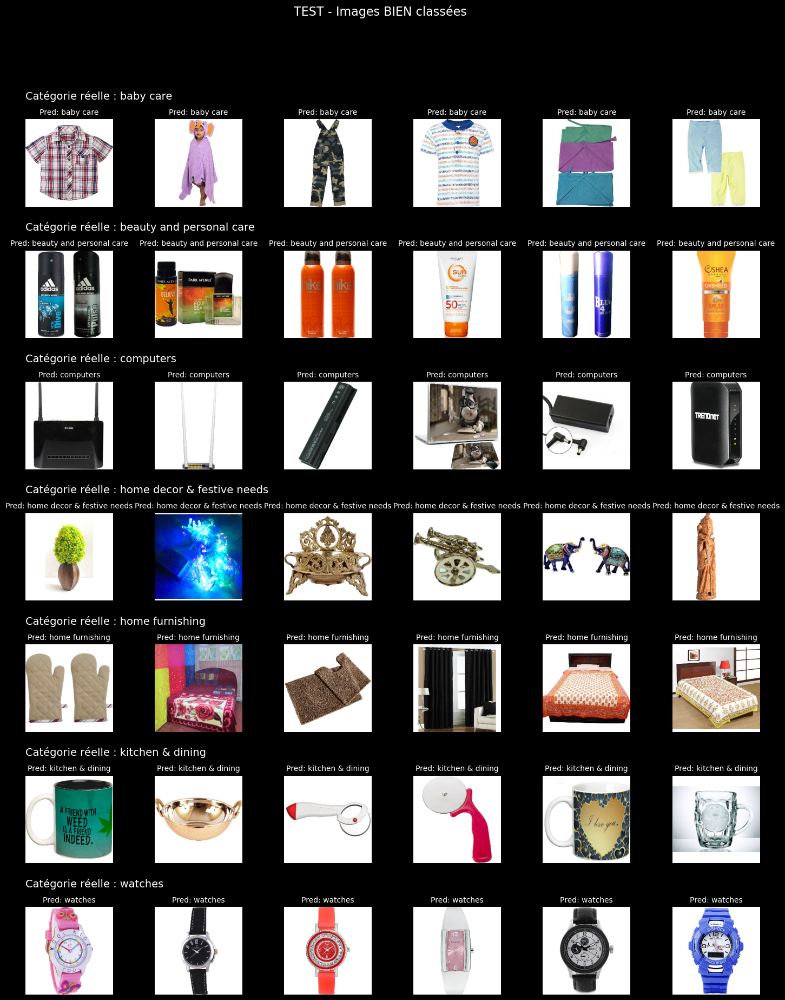

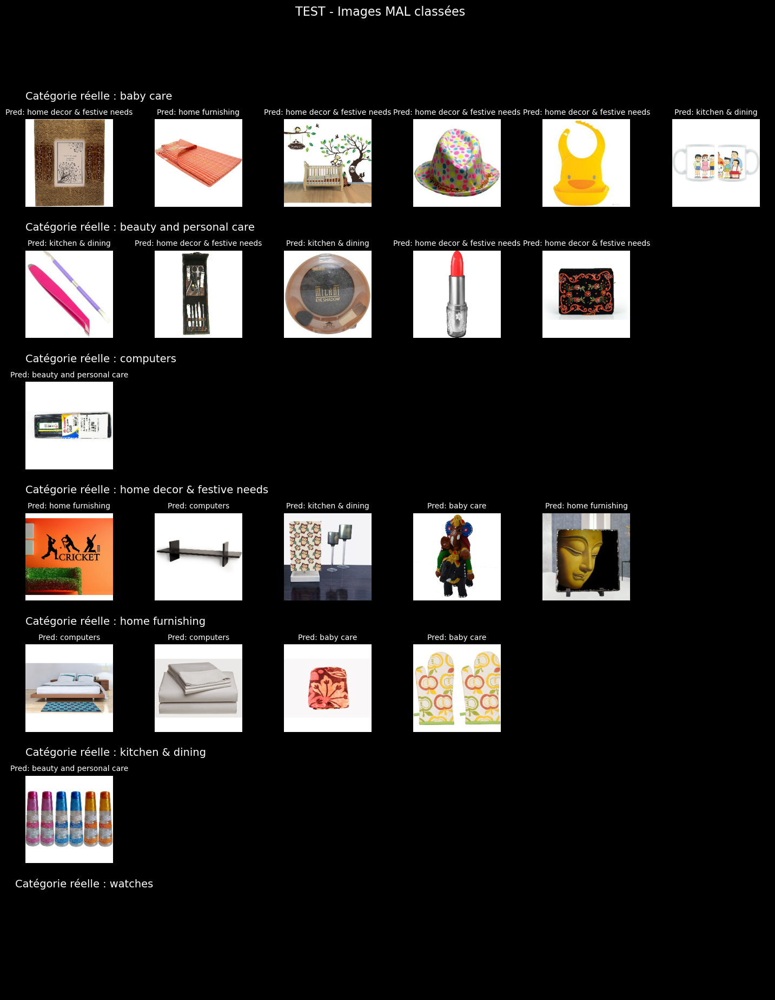

In [59]:
visualisation_images_TEST('BIEN', y_test, y_test_pred_classes, X_test, dict_label=label_to_category, num_examples=6)
visualisation_images_TEST('MAL', y_test, y_test_pred_classes, X_test, dict_label=label_to_category, num_examples=6)

- certaines erreurs de prédiction sont identiques, d'autres sont différentes, peut-être qu'une data-augmentation ciblée suivant les sous-catégories pourrait être plus efficiente (certaines sous catégories sont peu représentées)
- l'ensemble des résultats avec data-augmentation est cependant moins bon que sans data-augmentation lorsque nous utilisons le modèle pré-entraîné


# 2. Entraînement DenseNet121 SANS les poids imagenet

## 2.A Entraînement SANS les poids imagenet - SANS Data_augmentation

### Modèle

In [60]:
# couche d'entrée
input_tensor = tf.keras.layers.Input(shape=(img_height, img_width, 3))
# Desnet121 non pré-entraîné et sans la couche de sortie initiale
base_model = DenseNet121(weights=None, include_top=False, input_tensor=input_tensor)
# dégeler les poids des couches du modèle de base pour les réentraîner
for layer in base_model.layers:
    layer.trainable = True
    
# couches de sorties personnalisées
x = base_model.output
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
output_tensor = tf.keras.layers.Dense(7, activation='softmax')(x)  # 7 classes

model = tf.keras.models.Model(inputs=input_tensor, outputs=output_tensor)

# paramètres d'entraînement augmentés pour palier la non utilisation des poids imagenet
nb_epochs=100
es_patience=15
lr_patience=8
# visualisation du modèle
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_4    │ (None, 230, 230,  │          0 │ input_layer_3[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_4… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_5    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_5… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 58,425,927 (222.88 MB)

 Trainable params: 58,342,279 (222.56 MB)

 Non-trainable params: 83,648 (326.75 KB)

In [61]:
# compiler le modèle 
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)
metrics=['accuracy']
model.compile(optimizer=optimizer, loss=loss, metrics=metrics, jit_compile=False) 
# "just in time compiler" sur false pour option deterministe et garantir la reproductibilité cf: tf.config.experimental.enable_op_determinism()

In [62]:
# définition des callbacks : ajustements du processus d'entraînement sous certaines conditions
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=es_patience, restore_best_weights=True)
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=lr_patience, min_lr=1e-4)


In [63]:
# entraînement
time1 = time.time()
history = model.fit(train_dataset, epochs=nb_epochs, validation_data=val_dataset, callbacks=[
    early_stopping, 
    lr_scheduler])
time2 = time.time() - time1
minutes, seconds = divmod(time2, 60)
duration_str = f"{int(minutes)} min {int(seconds)} sec"

Epoch 1/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 79s 813ms/step - accuracy: 0.1684 - loss: 39.2065 - val_accuracy: 0.2038 - val_loss: 258.9564 - learning_rate: 0.0010
Epoch 2/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 17s 592ms/step - accuracy: 0.1472 - loss: 8.3513 - val_accuracy: 0.1465 - val_loss: 141.3800 - learning_rate: 0.0010
Epoch 3/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 17s 592ms/step - accuracy: 0.2260 - loss: 3.5787 - val_accuracy: 0.1465 - val_loss: 1.9469 - learning_rate: 0.0010
Epoch 4/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 17s 593ms/step - accuracy: 0.3320 - loss: 1.8907 - val_accuracy: 0.1529 - val_loss: 1.9540 - learning_rate: 0.0010
Epoch 5/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 17s 592ms/step - accuracy: 0.3927 - loss: 1.6523 - val_accuracy: 0.1656 - val_loss: 2.0043 - learning_rate: 0.0010
Epoch 6/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 18s 626ms/step - accuracy: 0.4196 - loss: 1.6531 - val_accuracy: 0.2102 - val_loss: 1.9391 - learning_rate: 0.0010
Epoch 7/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 18s 629ms/step - accuracy: 0.383

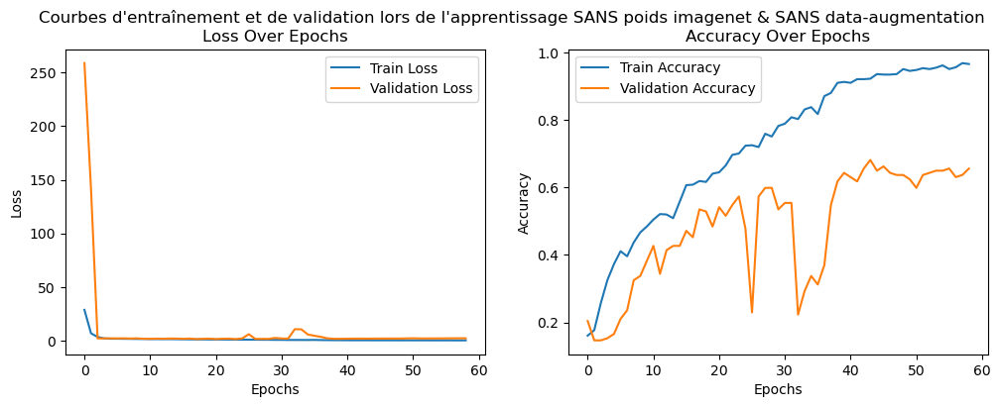

In [64]:
plt.figure(figsize=(12, 4))

# visualiser la perte pendant l'apprentissage
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()

# visualiser l'accuracy pendant l'apprentissage
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs')
plt.legend()

plt.suptitle("Courbes d'entraînement et de validation lors de l'apprentissage SANS poids imagenet & SANS data-augmentation")
plt.show()

### Évaluation TRAIN

In [65]:
X_train, y_train, y_train_pred_classes = get_predictions(model, train_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


2025-01-05 09:48:51.490937: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [66]:
print("Classification Report  - TRAIN - no preprocess:")
print(classification_report(y_train, y_train_pred_classes))

Classification Report  - TRAIN - no preprocess:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       105
           1       0.99      1.00      1.00       105
           2       1.00      1.00      1.00       105
           3       0.99      1.00      1.00       105
           4       1.00      0.98      0.99       105
           5       0.99      1.00      1.00       105
           6       1.00      0.99      1.00       105

    accuracy                           0.99       735
   macro avg       0.99      0.99      0.99       735
weighted avg       0.99      0.99      0.99       735



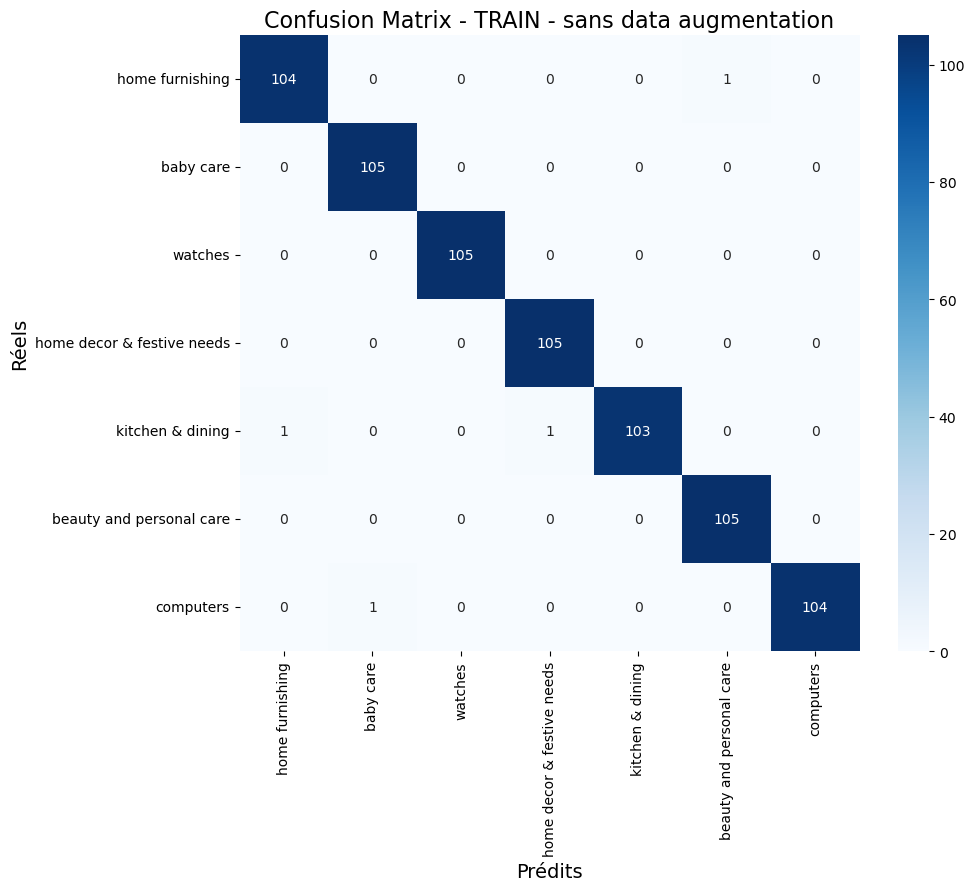

In [67]:
conf_matrix_train = confusion_matrix(y_train, y_train_pred_classes)
plot_confusion_matrix(conf_matrix_train, 'TRAIN',  data_augment=False)

### Évaluation VALIDATION

In [68]:
X_val, y_val, y_val_pred_classes = get_predictions(model, val_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


2025-01-05 09:48:54.195738: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [69]:
print("Classification Report  - VALIDATION - no preprocess:")
print(classification_report(y_val, y_val_pred_classes))

Classification Report  - VALIDATION - no preprocess:
              precision    recall  f1-score   support

           0       0.64      0.64      0.64        22
           1       0.70      0.70      0.70        23
           2       0.58      0.65      0.61        23
           3       0.57      0.59      0.58        22
           4       0.68      0.65      0.67        23
           5       0.71      0.68      0.70        22
           6       0.95      0.86      0.90        22

    accuracy                           0.68       157
   macro avg       0.69      0.68      0.68       157
weighted avg       0.69      0.68      0.68       157



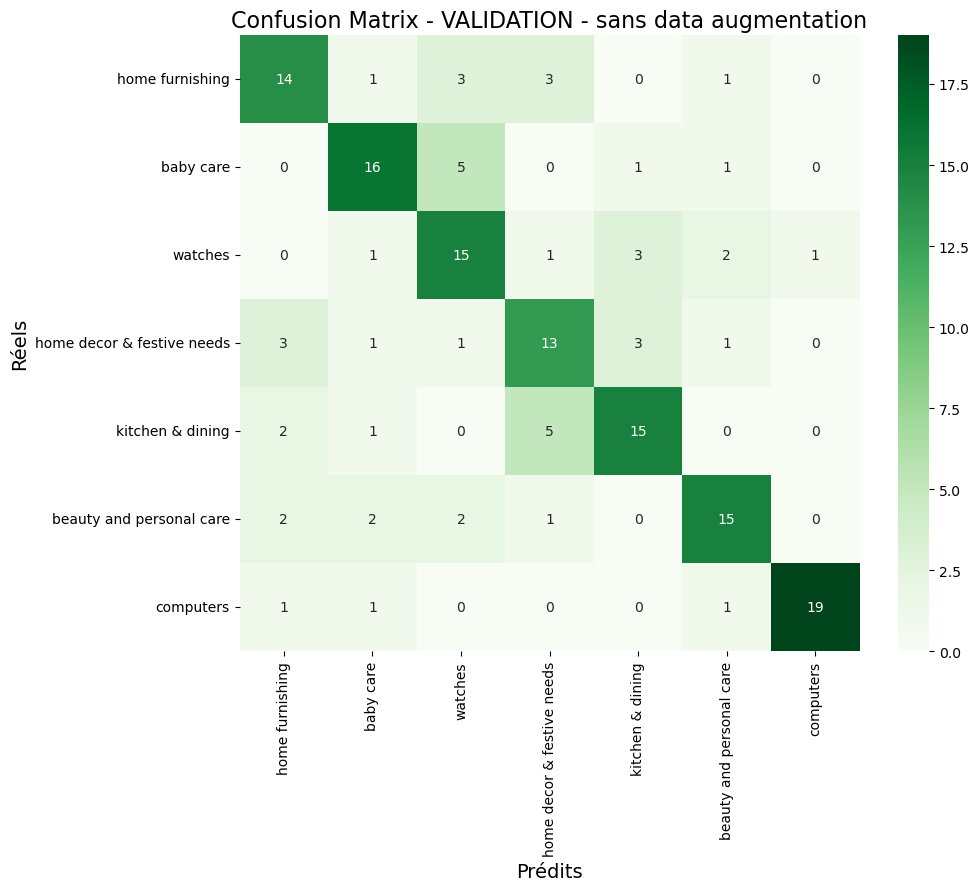

In [70]:
conf_matrix_val = confusion_matrix(y_val, y_val_pred_classes)
plot_confusion_matrix(conf_matrix_val, 'VALIDATION',  data_augment=False)

### Évaluation TRAIN+VALIDATION

In [71]:
train_val_dataset = train_dataset.concatenate(val_dataset)
loss_trainval, accuracy_trainval = model.evaluate(train_val_dataset)

28/28 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - accuracy: 0.9850 - loss: 0.0764


In [72]:
X_train_val, y_train_val, y_train_val_pred_classes = get_predictions(model, train_val_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

2025-01-05 09:49:12.300125: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [73]:
print("Classification Report  - TRAIN+VALIDATION - SANS poids imagenet & SANS data-augmentation :")
print(classification_report(y_train_val, y_train_val_pred_classes))

Classification Report  - TRAIN+VALIDATION - SANS poids imagenet & SANS data-augmentation :
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       127
           1       0.94      0.95      0.94       128
           2       0.92      0.94      0.93       128
           3       0.91      0.93      0.92       127
           4       0.94      0.92      0.93       128
           5       0.94      0.94      0.94       127
           6       0.99      0.97      0.98       127

    accuracy                           0.94       892
   macro avg       0.94      0.94      0.94       892
weighted avg       0.94      0.94      0.94       892



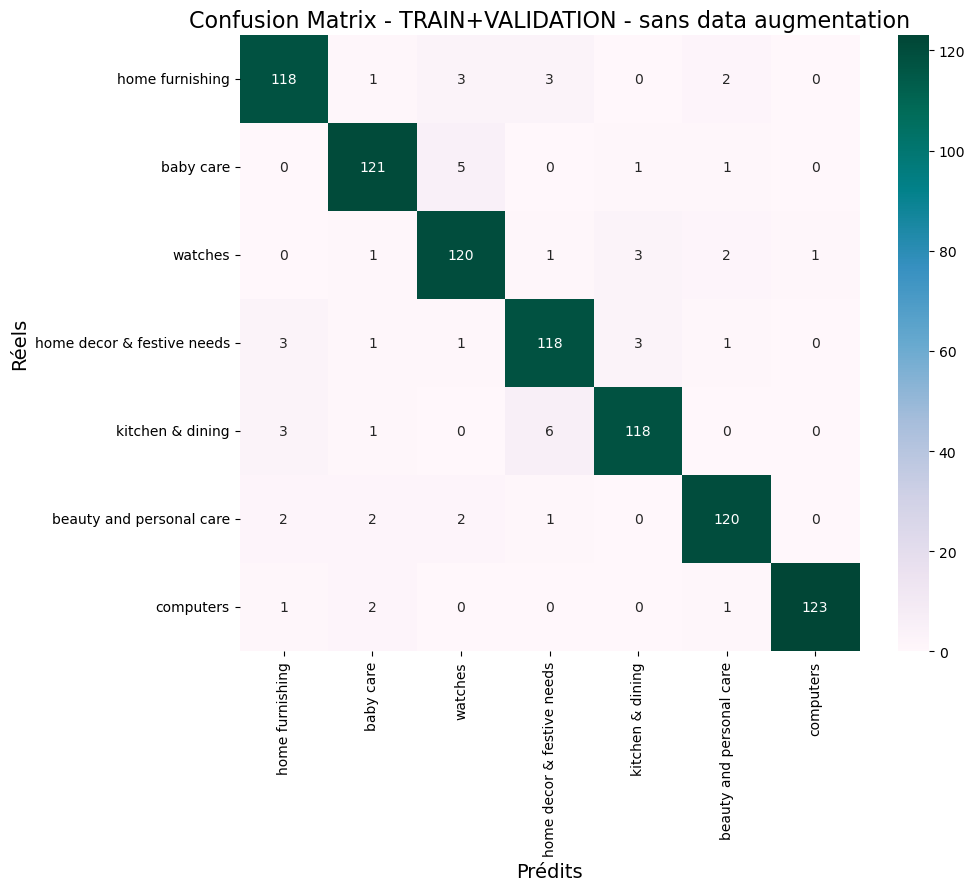

In [74]:
conf_matrix_train_val = confusion_matrix(y_train_val, y_train_val_pred_classes)
plot_confusion_matrix(conf_matrix_train_val, 'TRAIN+VALIDATION',  data_augment=False)

### Évaluation TEST

In [75]:
loss_test, accuracy_test = model.evaluate(test_dataset)

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - accuracy: 0.6839 - loss: 1.5955


In [76]:
X_test, y_test ,y_test_pred_classes = get_predictions(model, test_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


2025-01-05 09:49:16.806823: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [77]:
print("Classification Report - TEST - SANS poids imagenet & SANS data-augmentation :")
print(classification_report(y_test, y_test_pred_classes))

Classification Report - TEST - SANS poids imagenet & SANS data-augmentation :
              precision    recall  f1-score   support

           0       0.50      0.39      0.44        23
           1       0.62      0.82      0.71        22
           2       0.83      0.86      0.84        22
           3       0.50      0.39      0.44        23
           4       0.38      0.41      0.39        22
           5       0.75      0.78      0.77        23
           6       0.95      0.91      0.93        23

    accuracy                           0.65       158
   macro avg       0.65      0.65      0.65       158
weighted avg       0.65      0.65      0.65       158



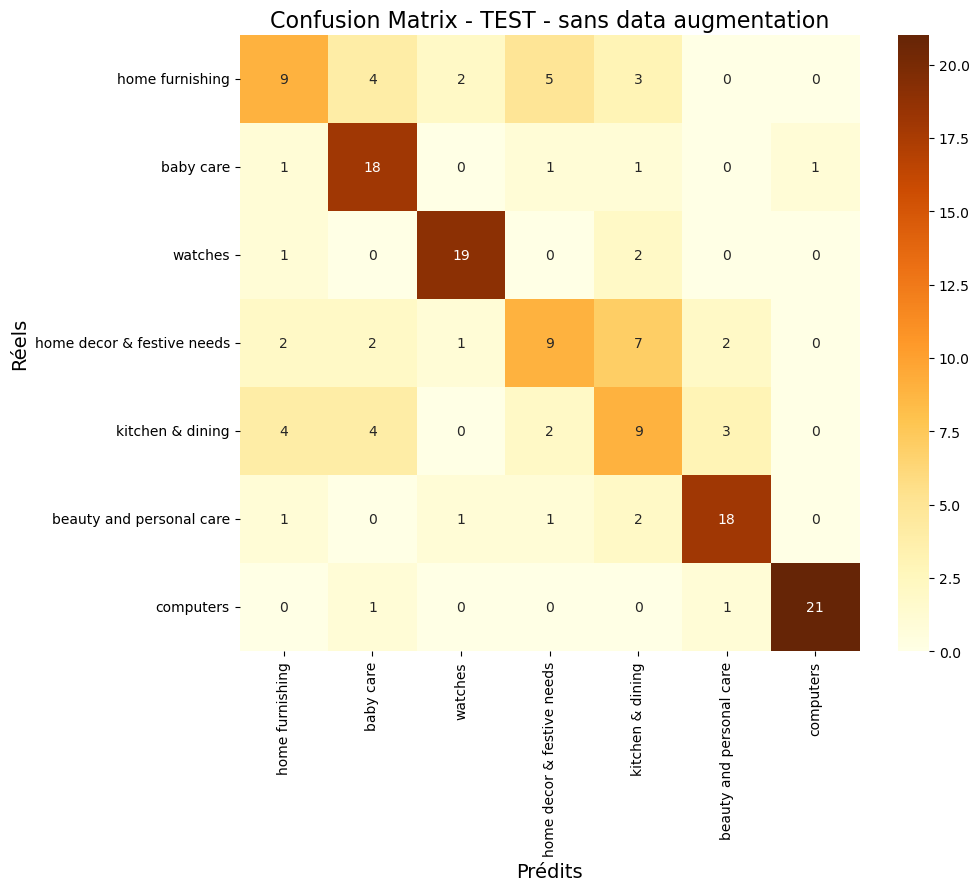

In [78]:
conf_matrix_test = confusion_matrix(y_test, y_test_pred_classes)
plot_confusion_matrix(conf_matrix_test, 'TEST',  data_augment=False)

### Enregistrement des résultats

In [79]:
perf_test_df = pd.concat([perf_test_df, pd.DataFrame({'Scenario': ['model_2A'], 
                                                      'Description': ['SANS poids imagenet & SANS data-augmentation'], 
                                                      'Accuracy_TrainVal': [accuracy_trainval *100],
                                                      'Loss_TrainVal' : [loss_trainval],
                                                      'Accuracy_Test': [accuracy_test *100], 
                                                      'Loss_Test': [loss_test],
                                                      'Durée_training': [duration_str]})], ignore_index=True)
perf_test_df

,Scenario,Description,Accuracy_TrainVal,Loss_TrainVal,Accuracy_Test,Loss_Test,Durée_training
0,model_1A,AVEC poids imagenet & SANS data-augmentation,97.533631,0.443065,88.607597,1.236787,3 min 4 sec
1,model_1B,AVEC poids imagenet & AVEC data-augmentation,97.197312,0.381347,84.810126,1.411997,2 min 38 sec
2,model_2A,SANS poids imagenet & SANS data-augmentation,93.946189,0.325691,65.189874,1.777045,17 min 57 sec


### Visualisation des images bien et mal classées sur le TEST

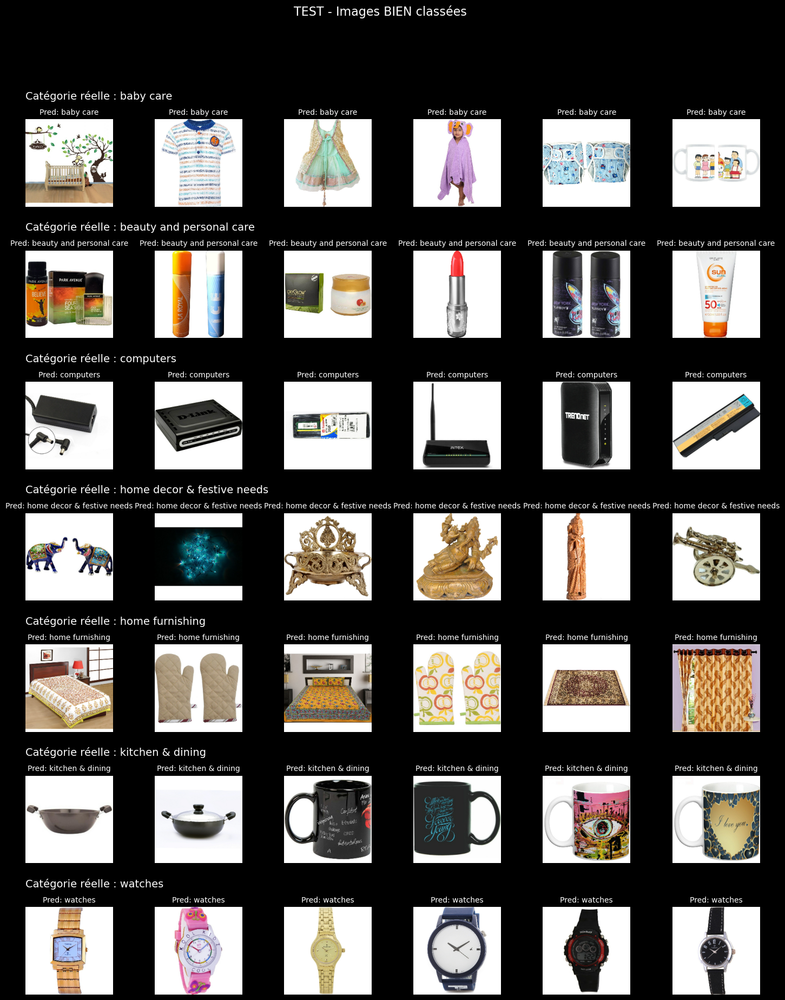

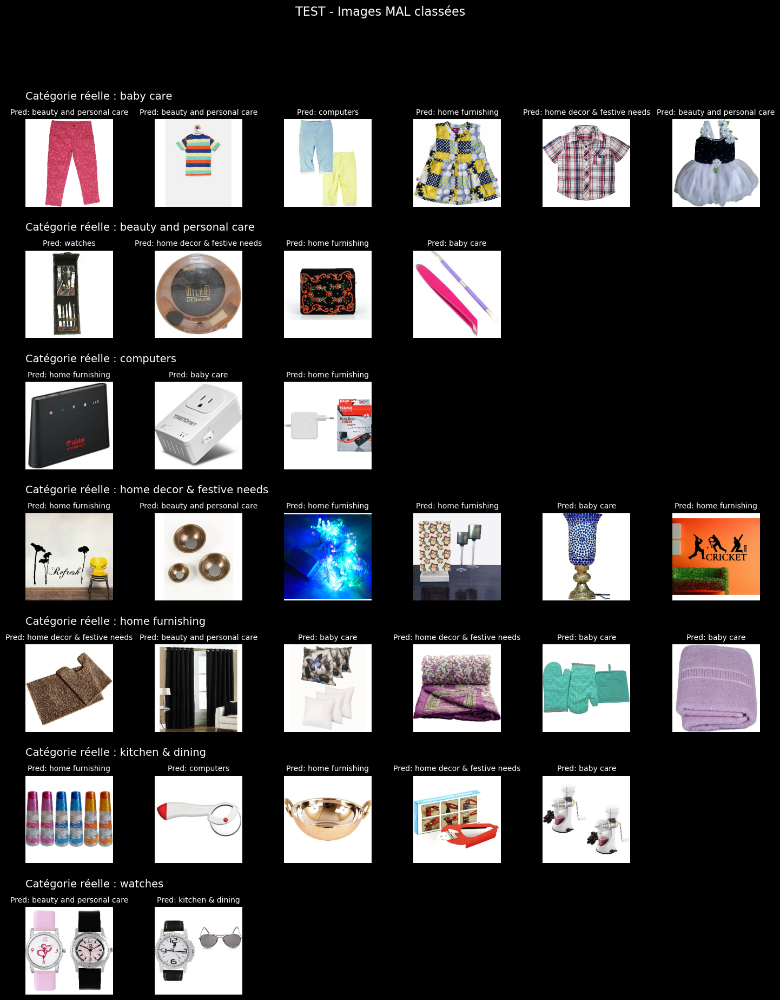

In [80]:
visualisation_images_TEST('BIEN', y_test, y_test_pred_classes, X_test, dict_label=label_to_category, num_examples=6)
visualisation_images_TEST('MAL', y_test, y_test_pred_classes, X_test, dict_label=label_to_category, num_examples=6)

- forte perte de qualité de classification, malgré le rajout important d'epoch pour compenser la non-utilisation des poids imagenet.

## 2.B Entraînement SANS les poids imagenet - AVEC Data_augmentation
*  les transformations retenues :
    - rotation gauche ou droite de 2 degrés
    - zoom 1.2x


### Modèle


In [81]:
# préparation de la data augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomRotation(0.0349),  # Rotation gauche ou droite de 0.0349 radians, équivalent à 2 degrés (= Pi * X degrés / 180 degrés)
    tf.keras.layers.RandomZoom((0.0, 0.2)),  # Zoom aléatoire entre 1x et 1.2x
])
# couche d'entrée
input_tensor = tf.keras.layers.Input(shape=(img_height, img_width, 3))
augmented_input = data_augmentation(input_tensor)
# Desnet121 non pré-entraîné et sans la couche de sortie initiale
base_model = DenseNet121(weights=None, include_top=False, input_tensor=augmented_input)
# dégeler les poids des couches du modèle de base pour les réentraîner
for layer in base_model.layers:
    layer.trainable = True
    
# couches de sorties personnalisées
x = base_model.output
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
output_tensor = tf.keras.layers.Dense(7, activation='softmax')(x)  # 7 classes

model = tf.keras.models.Model(inputs=input_tensor, outputs=output_tensor)

# paramètres d'entraînement augmentés pour palier la non utilisation des poids imagenet
nb_epochs=100
es_patience=15
lr_patience=8
# visualisation du modèle
model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 224, 224,  │          0 │ input_layer_4[0]… │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_6    │ (None, 230, 230,  │          0 │ sequential_1[0][… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_6… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_7    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_7… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b

 Total params: 58,425,927 (222.88 MB)

 Trainable params: 58,342,279 (222.56 MB)

 Non-trainable params: 83,648 (326.75 KB)

In [82]:
# compiler le modèle 
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)
metrics=['accuracy']
model.compile(optimizer=optimizer, loss=loss, metrics=metrics, jit_compile=False) 
# "just in time compiler" sur false pour option deterministe et garantir la reproductibilité cf: tf.config.experimental.enable_op_determinism()

In [83]:
# définition des callbacks : ajustements du processus d'entraînement sous certaines conditions
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=es_patience, restore_best_weights=True)
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=lr_patience, min_lr=1e-4)


In [84]:
# entraînement
time1 = time.time()
history = model.fit(train_dataset, epochs=nb_epochs, validation_data=val_dataset, callbacks=[
    early_stopping, 
    lr_scheduler])
time2 = time.time() - time1
minutes, seconds = divmod(time2, 60)
duration_str = f"{int(minutes)} min {int(seconds)} sec"

Epoch 1/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 78s 845ms/step - accuracy: 0.1582 - loss: 28.2594 - val_accuracy: 0.1465 - val_loss: 32077.6309 - learning_rate: 0.0010
Epoch 2/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 18s 630ms/step - accuracy: 0.1772 - loss: 5.9453 - val_accuracy: 0.1783 - val_loss: 126.6369 - learning_rate: 0.0010
Epoch 3/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 17s 592ms/step - accuracy: 0.2279 - loss: 4.0311 - val_accuracy: 0.1465 - val_loss: 44.3845 - learning_rate: 0.0010
Epoch 4/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 17s 593ms/step - accuracy: 0.3329 - loss: 2.0028 - val_accuracy: 0.1019 - val_loss: 4.5675 - learning_rate: 0.0010
Epoch 5/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 17s 594ms/step - accuracy: 0.3934 - loss: 1.7420 - val_accuracy: 0.1083 - val_loss: 2.4961 - learning_rate: 0.0010
Epoch 6/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 17s 592ms/step - accuracy: 0.4320 - loss: 1.5840 - val_accuracy: 0.1338 - val_loss: 1.9381 - learning_rate: 0.0010
Epoch 7/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 18s 629ms/step - accuracy: 0.

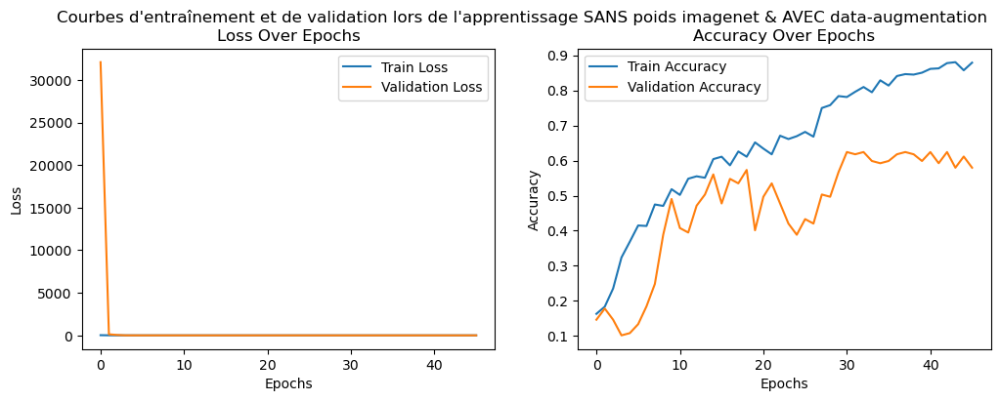

In [85]:
plt.figure(figsize=(12, 4))

# visualiser la perte pendant l'apprentissage
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()

# visualiser l'accuracy pendant l'apprentissage
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs')
plt.legend()

plt.suptitle("Courbes d'entraînement et de validation lors de l'apprentissage SANS poids imagenet & AVEC data-augmentation")
plt.show()

### Évaluation TRAIN

In [86]:
X_train, y_train, y_train_pred_classes = get_predictions(model, train_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


2025-01-05 10:03:50.461245: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [87]:
print("Classification Report  - TRAIN - no preprocess:")
print(classification_report(y_train, y_train_pred_classes))

Classification Report  - TRAIN - no preprocess:
              precision    recall  f1-score   support

           0       0.84      0.71      0.77       105
           1       0.91      0.83      0.87       105
           2       0.93      0.87      0.90       105
           3       0.72      0.80      0.76       105
           4       0.67      0.88      0.76       105
           5       0.92      0.88      0.90       105
           6       0.98      0.91      0.95       105

    accuracy                           0.84       735
   macro avg       0.85      0.84      0.84       735
weighted avg       0.85      0.84      0.84       735



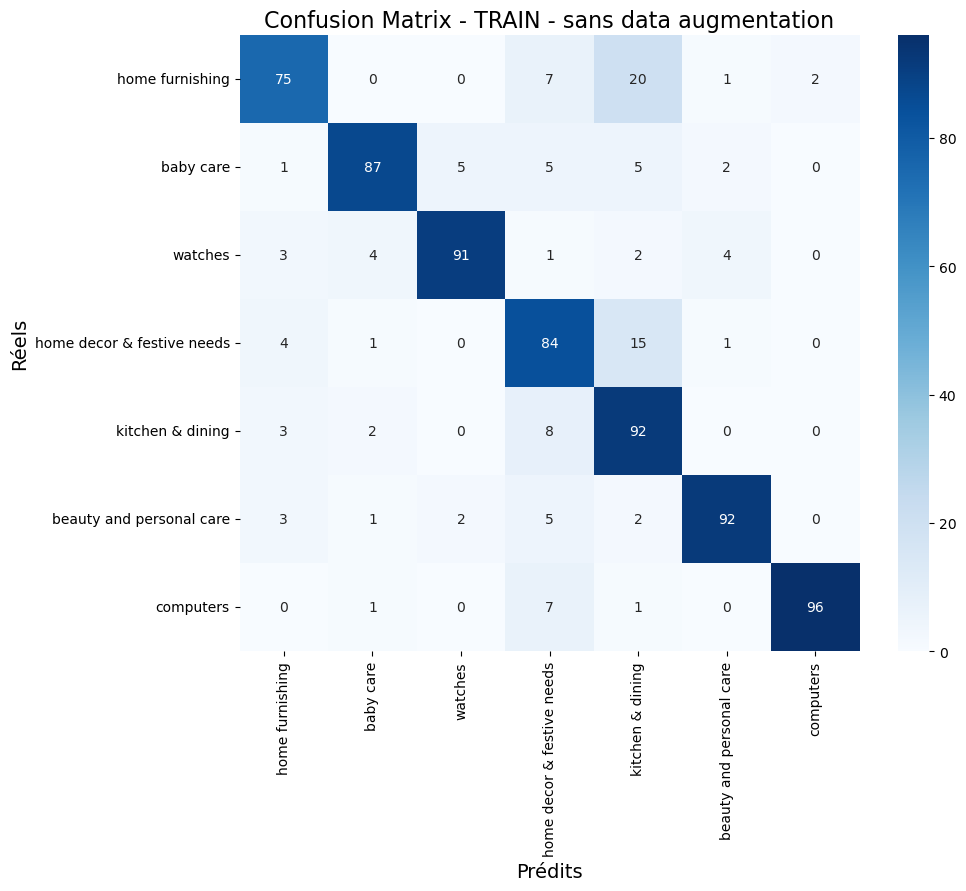

In [88]:
conf_matrix_train = confusion_matrix(y_train, y_train_pred_classes)
plot_confusion_matrix(conf_matrix_train, 'TRAIN',  data_augment=False)

### Évaluation VALIDATION

In [89]:
X_val, y_val, y_val_pred_classes = get_predictions(model, val_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


2025-01-05 10:03:53.161396: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [90]:
print("Classification Report  - VALIDATION - no preprocess:")
print(classification_report(y_val, y_val_pred_classes))

Classification Report  - VALIDATION - no preprocess:
              precision    recall  f1-score   support

           0       0.44      0.50      0.47        22
           1       0.83      0.65      0.73        23
           2       0.68      0.57      0.62        23
           3       0.57      0.59      0.58        22
           4       0.52      0.57      0.54        23
           5       0.58      0.68      0.62        22
           6       0.86      0.82      0.84        22

    accuracy                           0.62       157
   macro avg       0.64      0.62      0.63       157
weighted avg       0.64      0.62      0.63       157



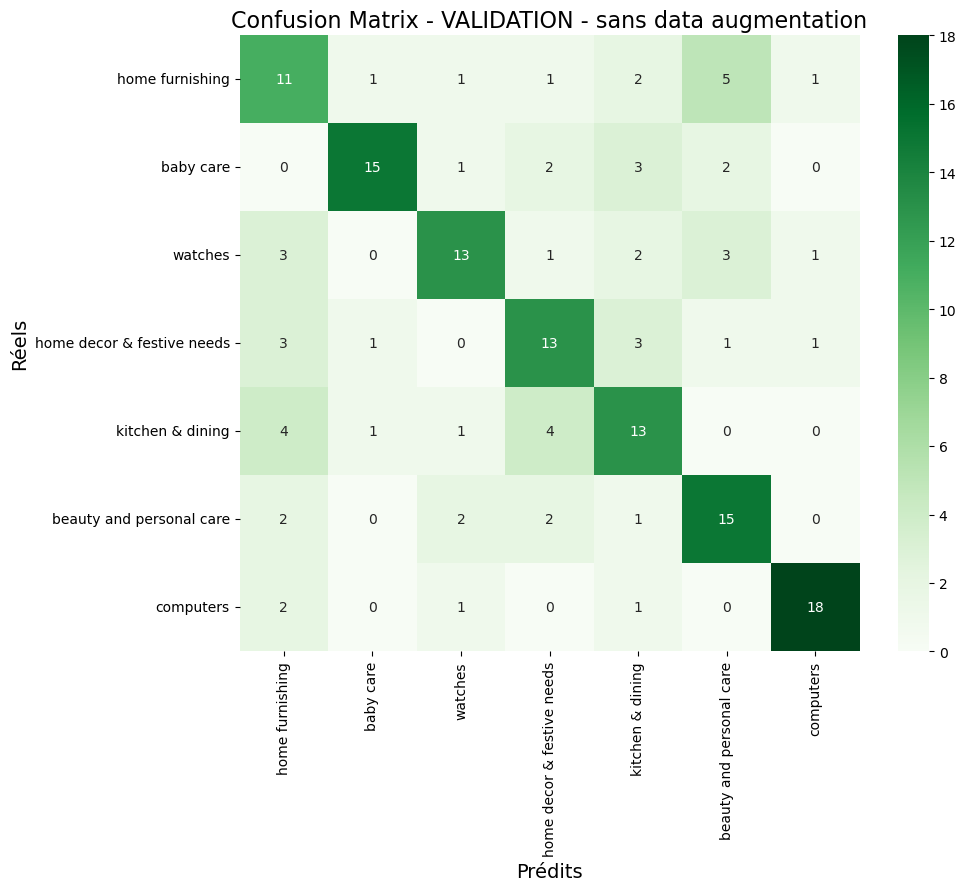

In [91]:
conf_matrix_val = confusion_matrix(y_val, y_val_pred_classes)
plot_confusion_matrix(conf_matrix_val, 'VALIDATION',  data_augment=False)

### Évaluation TRAIN+VALIDATION

In [92]:
train_val_dataset = train_dataset.concatenate(val_dataset)
loss_trainval, accuracy_trainval = model.evaluate(train_val_dataset)

28/28 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - accuracy: 0.8449 - loss: 0.4520


In [93]:
X_train_val, y_train_val, y_train_val_pred_classes = get_predictions(model, train_val_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

2025-01-05 10:04:11.088654: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [94]:
print("Classification Report  - TRAIN+VALIDATION - SANS poids imagenet & AVEC data-augmentation :")
print(classification_report(y_train_val, y_train_val_pred_classes))

Classification Report  - TRAIN+VALIDATION - SANS poids imagenet & AVEC data-augmentation :
              precision    recall  f1-score   support

           0       0.75      0.68      0.71       127
           1       0.89      0.80      0.84       128
           2       0.89      0.81      0.85       128
           3       0.69      0.76      0.73       127
           4       0.65      0.82      0.72       128
           5       0.85      0.84      0.85       127
           6       0.96      0.90      0.93       127

    accuracy                           0.80       892
   macro avg       0.81      0.80      0.80       892
weighted avg       0.81      0.80      0.80       892



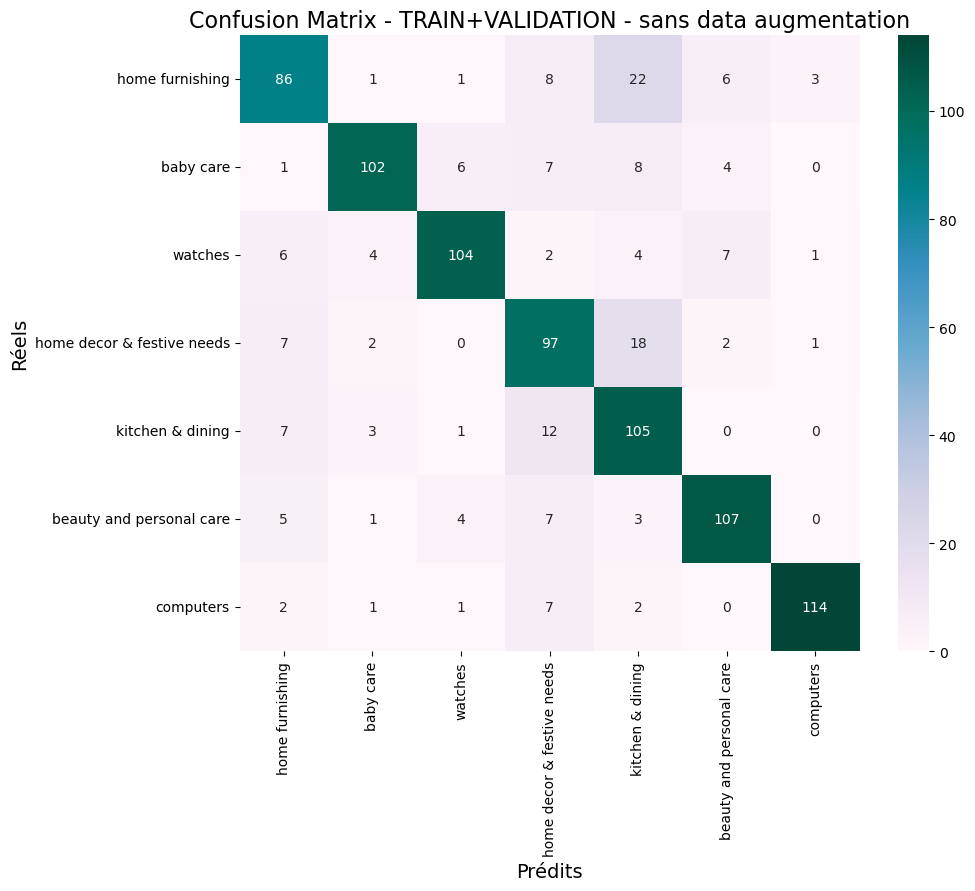

In [95]:
conf_matrix_train_val = confusion_matrix(y_train_val, y_train_val_pred_classes)
plot_confusion_matrix(conf_matrix_train_val, 'TRAIN+VALIDATION',  data_augment=False)

### Évaluation TEST

In [96]:
loss_test, accuracy_test = model.evaluate(test_dataset)

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - accuracy: 0.6918 - loss: 1.1099


In [97]:
X_test, y_test ,y_test_pred_classes = get_predictions(model, test_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


2025-01-05 10:04:15.686459: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [98]:
print("Classification Report - TEST - SANS poids imagenet & AVEC data-augmentation :")
print(classification_report(y_test, y_test_pred_classes))

Classification Report - TEST - SANS poids imagenet & AVEC data-augmentation :
              precision    recall  f1-score   support

           0       0.67      0.52      0.59        23
           1       0.64      0.73      0.68        22
           2       0.81      0.77      0.79        22
           3       0.56      0.61      0.58        23
           4       0.50      0.64      0.56        22
           5       0.79      0.83      0.81        23
           6       1.00      0.74      0.85        23

    accuracy                           0.69       158
   macro avg       0.71      0.69      0.69       158
weighted avg       0.71      0.69      0.69       158



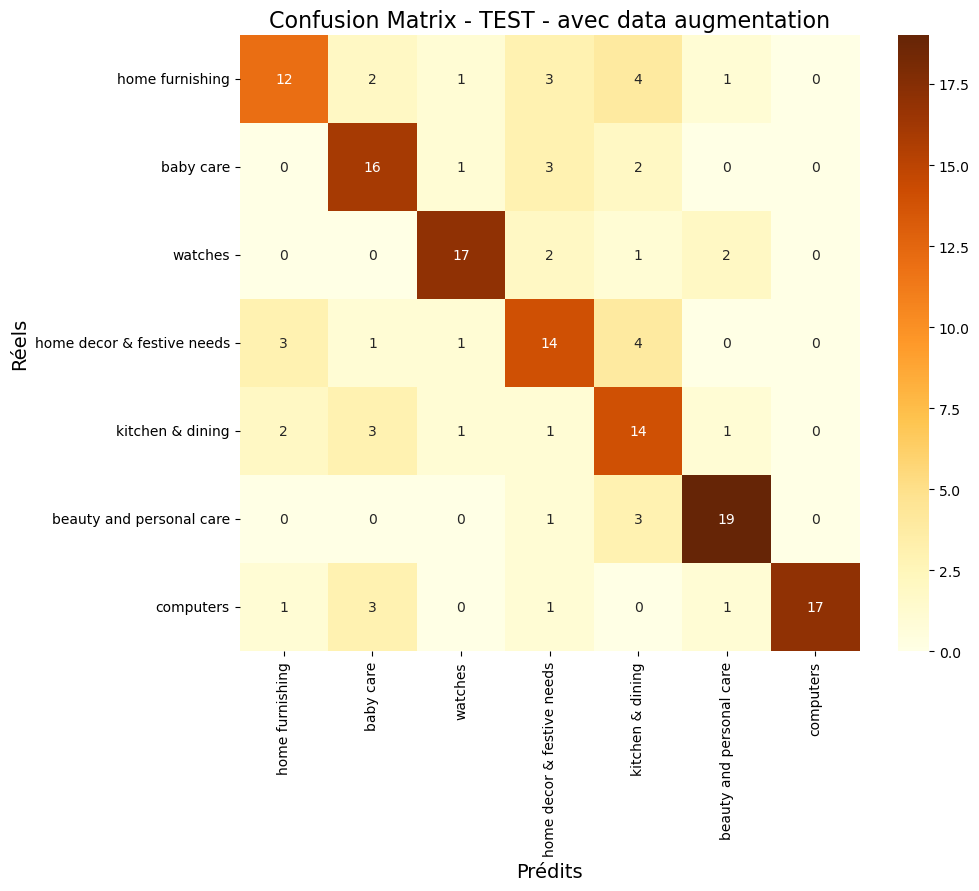

In [99]:
conf_matrix_test = confusion_matrix(y_test, y_test_pred_classes)
plot_confusion_matrix(conf_matrix_test, 'TEST',  data_augment=True)

### Enregistrement des résultats

In [100]:
perf_test_df = pd.concat([perf_test_df, pd.DataFrame({'Scenario': ['model_2B'], 
                                                      'Description': ['SANS poids imagenet & AVEC data-augmentation'], 
                                                      'Accuracy_TrainVal': [accuracy_trainval *100],
                                                      'Loss_TrainVal' : [loss_trainval],
                                                      'Accuracy_Test': [accuracy_test *100], 
                                                      'Loss_Test': [loss_test],
                                                      'Durée_training': [duration_str]})], ignore_index=True)
perf_test_df

,Scenario,Description,Accuracy_TrainVal,Loss_TrainVal,Accuracy_Test,Loss_Test,Durée_training
0,model_1A,AVEC poids imagenet & SANS data-augmentation,97.533631,0.443065,88.607597,1.236787,3 min 4 sec
1,model_1B,AVEC poids imagenet & AVEC data-augmentation,97.197312,0.381347,84.810126,1.411997,2 min 38 sec
2,model_2A,SANS poids imagenet & SANS data-augmentation,93.946189,0.325691,65.189874,1.777045,17 min 57 sec
3,model_2B,SANS poids imagenet & AVEC data-augmentation,80.156952,0.589508,68.987340,1.221051,14 min 10 sec


### Visualisation des images bien et mal classées sur le TEST

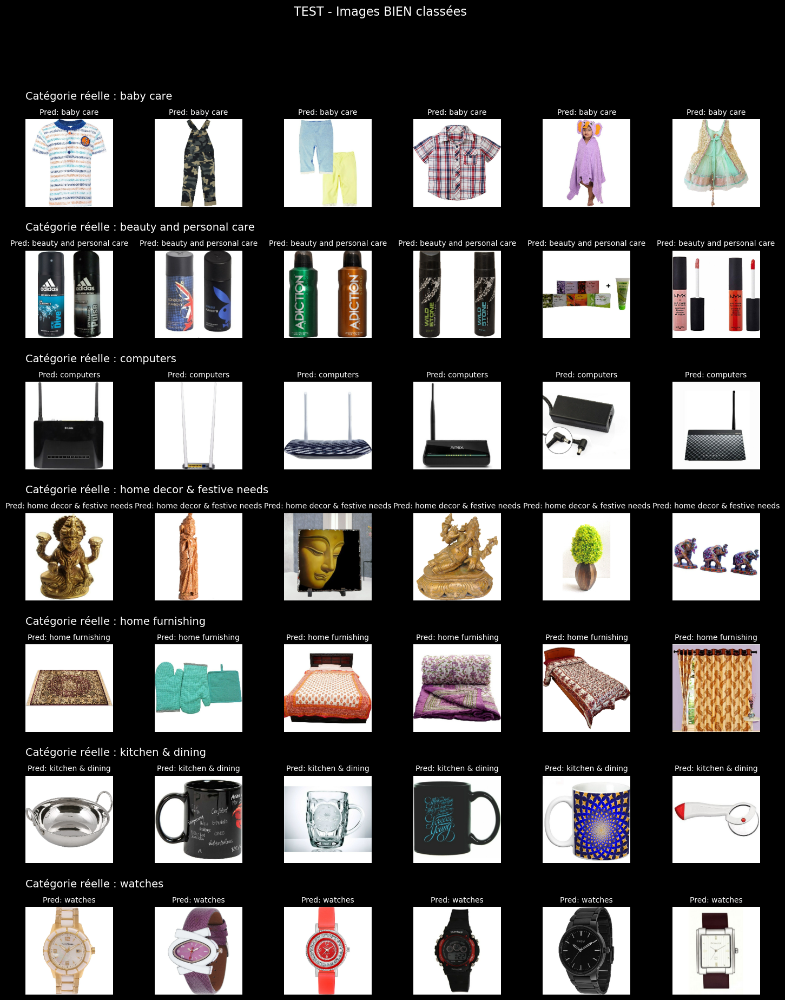

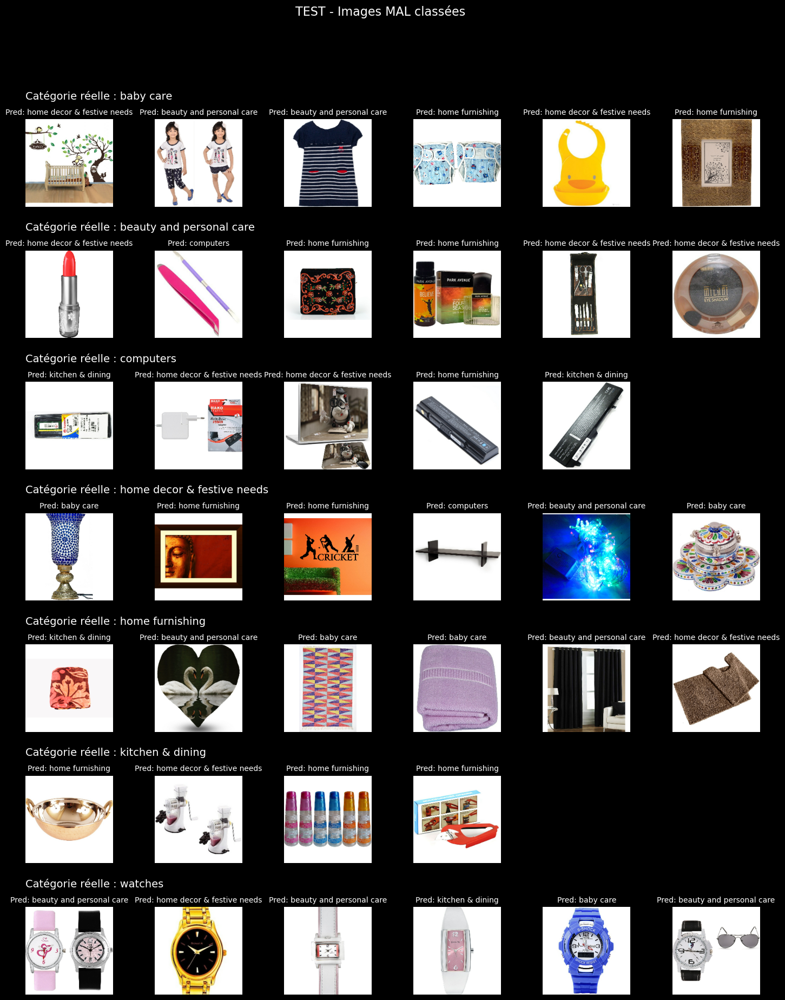

In [101]:
visualisation_images_TEST('BIEN', y_test, y_test_pred_classes, X_test, dict_label=label_to_category, num_examples=6)
visualisation_images_TEST('MAL', y_test, y_test_pred_classes, X_test, dict_label=label_to_category, num_examples=6)

- par rapport au précédent modèle, sans les poids imagenet et sans data-augmentation, on note un gain certain en qualité de classification grâce à la data augmentation sur un modèle non pré-entraîné.
- les résultats globaux de ce modèle restent faibles.

# Comparaison des 4 scénarios

In [102]:
perf_test_df

,Scenario,Description,Accuracy_TrainVal,Loss_TrainVal,Accuracy_Test,Loss_Test,Durée_training
0,model_1A,AVEC poids imagenet & SANS data-augmentation,97.533631,0.443065,88.607597,1.236787,3 min 4 sec
1,model_1B,AVEC poids imagenet & AVEC data-augmentation,97.197312,0.381347,84.810126,1.411997,2 min 38 sec
2,model_2A,SANS poids imagenet & SANS data-augmentation,93.946189,0.325691,65.189874,1.777045,17 min 57 sec
3,model_2B,SANS poids imagenet & AVEC data-augmentation,80.156952,0.589508,68.987340,1.221051,14 min 10 sec


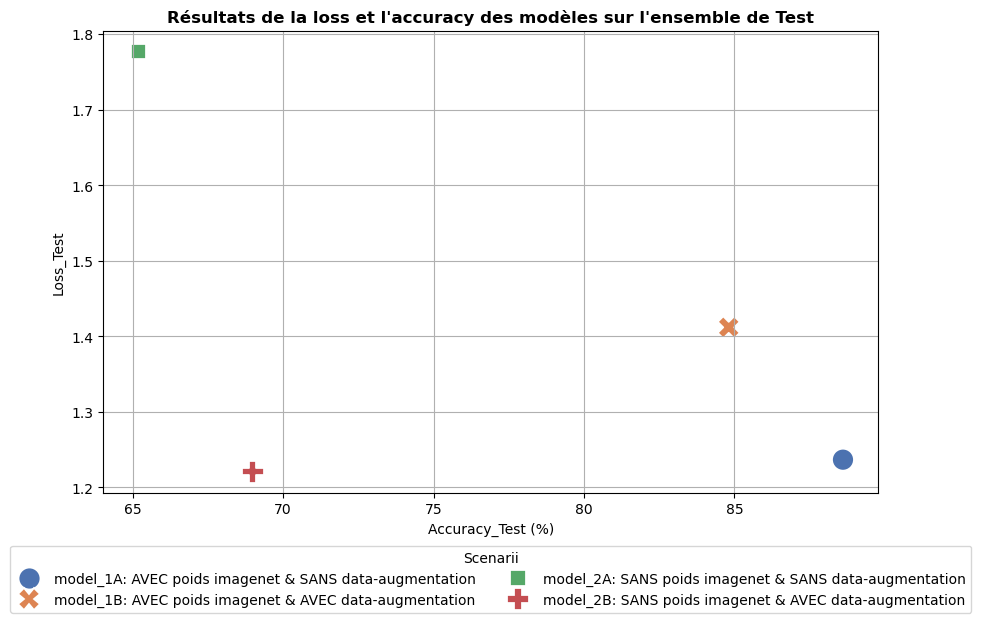

In [103]:
perf_test_df['Scenario_Description'] = perf_test_df['Scenario'] + ': ' + perf_test_df['Description']

plt.figure(figsize=(10,6))
scatter = sns.scatterplot(data=perf_test_df, x='Accuracy_Test', y='Loss_Test', hue='Scenario_Description', style='Scenario_Description', palette='deep', s=250)
plt.legend(title='Scenarii', bbox_to_anchor=(0.5, -0.1), loc='upper center', ncol=2)
plt.grid(True)
plt.title('Résultats de la loss et l\'accuracy des modèles sur l\'ensemble de Test', fontweight='bold')
plt.xlabel('Accuracy_Test (%)')
plt.ylabel('Loss_Test')
plt.show()